PROYECTO INTEGRADOR MODULO 4
AVANCE 1 

1-Leer el archivo readme.txt y analiza las columnas y datos 
2-crear archivo notebook y cambiar nombre y apellido ,Importacion de librerias a utilizar
3- leer archivo con codigo python en visual studio code

In [6]:
#COMENZAMOS IMPORTANDO LIBRERIAS NECESARIAS PARA EL ANALISIS
import numpy as np
import pandas as pd

In [7]:
#ruta al archivo csv
data_latinoamerica = "C:/Users/yana/Downloads/data_latinoamerica.csv"

#leer el archivo csv

df_data_latinoamerica = pd.read_csv("C:/Users/yana/Downloads/data_latinoamerica.csv")

print(df_data_latinoamerica.head()) #MOSTRAR PRIMEROS DATOS DEL DATASET CON 'HEAD'

KeyboardInterrupt: 

4-comprobar que el dataset cargado tiene la cantidad de registros y columnas especificadas

In [6]:
df_data_latinoamerica.columns # verificar cantidad de columnas obtenidas

Index(['location_key', 'date', 'country_code', 'country_name', 'new_confirmed',
       'new_deceased', 'cumulative_confirmed', 'cumulative_deceased',
       'cumulative_vaccine_doses_administered', 'population',
       'population_male', 'population_female', 'population_rural',
       'population_urban', 'population_density', 'human_development_index',
       'population_age_00_09', 'population_age_10_19', 'population_age_20_29',
       'population_age_30_39', 'population_age_40_49', 'population_age_50_59',
       'population_age_60_69', 'population_age_70_79',
       'population_age_80_and_older', 'gdp_usd', 'gdp_per_capita_usd',
       'latitude', 'longitude', 'area_sq_km', 'smoking_prevalence',
       'diabetes_prevalence', 'infant_mortality_rate', 'nurses_per_1000',
       'physicians_per_1000', 'average_temperature_celsius',
       'minimum_temperature_celsius', 'maximum_temperature_celsius',
       'rainfall_mm', 'relative_humidity', 'population_largest_city',
       'area_rural_

In [7]:
df_data_latinoamerica.shape

(12216057, 50)

5- seleccionar los paises donde se expandiran : Colombia, Argentina,Chile,Mexico,Peru y Brazil

In [75]:
paises_seleccionados = ['Argentina','Chile','Colombia','Mexico','Peru','Brazil']
data_latinoamerica =df_data_latinoamerica[df_data_latinoamerica['country_name'].isin(paises_seleccionados)]

NameError: name 'df_data_latinoamerica' is not defined

In [9]:
np.shape(data_latinoamerica) #obtenemos 11.970.289 de registros para trabajar

(11970289, 50)

In [25]:
paises_seleccionados = ['Argentina','Chile','Colombia','Mexico','Peru','Brazil']

verificamos la calidad de los datos , verificamos datos faltantes y si es necesario hacemos una limpieza donde se presenten valores mayores a 4 millones de datos faltantes

In [10]:
data_latinoamerica.isnull().sum()[data_latinoamerica.isnull().sum()>4000000]

new_confirmed                             5620283
new_deceased                              5661788
cumulative_confirmed                      5619937
cumulative_deceased                       5661426
cumulative_vaccine_doses_administered    11706131
population_rural                         11964343
population_urban                         11964343
population_density                       11964343
human_development_index                   6472221
gdp_usd                                  11963352
gdp_per_capita_usd                       11962361
smoking_prevalence                       11964343
diabetes_prevalence                      11964343
infant_mortality_rate                    11964343
nurses_per_1000                          11964343
physicians_per_1000                      11964343
population_largest_city                  11964343
area_rural_sq_km                         11964343
area_urban_sq_km                         11964343
life_expectancy                          11964343


realizamos un nuevo filtro por columna 'location_key' pero solo utilizamos las instancias que correspondan a los paises que hemos seleccionado antriormente y no a sus regiones o subregiones AR,CL,CO,MX,PE,BR.

In [11]:
data_latinoamerica_paises = df_data_latinoamerica[df_data_latinoamerica['location_key'].isin(['AR','CL','CO','MX','PE','BR'])]

para comprension de los datos, vamos a tomar los datos a partir de la fecha 2021-01-01,ya que es la fecha en la que se empezaron a registrar mejor los datos

In [12]:
data_latinoamerica_paises_fecha = data_latinoamerica_paises[data_latinoamerica_paises['date']>'2021-01-01']

con este filtro vemos que cantidad de elementos tenemos vacios, en caso de tenerlos, debemos proceder a eliminarlos.

In [13]:
#contamos valores nulos
valores_nulos_fecha = data_latinoamerica_paises_fecha.isnull().sum()[data_latinoamerica_paises_fecha.isnull().sum()>0]
print(valores_nulos_fecha)
print(np.shape(data_latinoamerica_paises_fecha))

new_confirmed                              21
new_deceased                               21
cumulative_confirmed                       21
cumulative_deceased                        21
cumulative_vaccine_doses_administered     584
average_temperature_celsius                42
minimum_temperature_celsius                41
maximum_temperature_celsius                41
rainfall_mm                                90
relative_humidity                          42
new_recovered                            2116
cumulative_recovered                     2736
dtype: int64
(3744, 50)


Usar un for para completar los valores nulos de las columnas de la media de cada pais.

In [18]:
for pais in paises_seleccionados:
    data_latinoamerica_paises_fecha['new_confirmed'] = data_latinoamerica_paises_fecha['new_confirmed'].fillna(data_latinoamerica_paises_fecha[data_latinoamerica_paises_fecha['country_name']==pais]['new_confirmed'].mean())
data_latinoamerica_paises_fecha['new_deceased'] =data_latinoamerica_paises_fecha['new_deceased'].fillna(data_latinoamerica_paises_fecha[data_latinoamerica_paises_fecha['country_name']==pais]['new_deceased'].mean())
data_latinoamerica_paises_fecha['cumulative_confirmed']=data_latinoamerica_paises_fecha['cumulative_confirmed'].fillna(data_latinoamerica_paises_fecha[data_latinoamerica_paises_fecha['country_name']==pais]['cumulative_confirmed'].mean())
data_latinoamerica_paises_fecha['cumulative_deceased']=data_latinoamerica_paises_fecha['cumulative_deceased'].fillna(data_latinoamerica_paises_fecha[data_latinoamerica_paises_fecha['country_name']==pais]['cumulative_deceased'].mean())
data_latinoamerica_paises_fecha['rainfall_mm']=data_latinoamerica_paises_fecha['rainfall_mm'].fillna(data_latinoamerica_paises_fecha[data_latinoamerica_paises_fecha['country_name']==pais]['rainfall_mm'].mean())
data_latinoamerica_paises_fecha['relative_humidity']=data_latinoamerica_paises_fecha['relative_humidity'].fillna(data_latinoamerica_paises_fecha[data_latinoamerica_paises_fecha['country_name']==pais]['relative_humidity'].mean())
data_latinoamerica_paises_fecha['average_temperature_celsius']=data_latinoamerica_paises_fecha['average_temperature_celsius'].fillna(data_latinoamerica_paises_fecha[data_latinoamerica_paises_fecha['country_name']==pais]['average_temperature_celsius'].mean())
data_latinoamerica_paises_fecha['minimum_temperature_celsius'] =data_latinoamerica_paises_fecha['minimum_temperature_celsius'].fillna(data_latinoamerica_paises_fecha[data_latinoamerica_paises_fecha['country_name']==pais]['minimum_temperature_celsius'].mean())
data_latinoamerica_paises_fecha['maximum_temperature_celsius']=data_latinoamerica_paises_fecha['maximum_temperature_celsius'].fillna(data_latinoamerica_paises_fecha[data_latinoamerica_paises_fecha['country_name']==pais]['maximum_temperature_celsius'].mean())

#llenar Nan con el valor de 0 en la columna new_recovered,cumulative_recovered,cumulative_vaccine_doses_administered para hacer analisis en estos datos
data_latinoamerica_paises_fecha['new_recovered']=data_latinoamerica_paises_fecha['new_recovered'].fillna(0)
data_latinoamerica_paises_fecha['cumulative_recovered']=data_latinoamerica_paises_fecha['cumulative_recovered'].fillna(0)
data_latinoamerica_paises_fecha['cumulative_vaccine_doses_administered']=data_latinoamerica_paises_fecha['cumulative_vaccine_doses_administered'].fillna(0)

C:\Users\yana\AppData\Local\Temp\ipykernel_3448\3029924937.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_latinoamerica_paises_fecha['new_confirmed'] = data_latinoamerica_paises_fecha['new_confirmed'].fillna(data_latinoamerica_paises_fecha[data_latinoamerica_paises_fecha['country_name']==pais]['new_confirmed'].mean())
C:\Users\yana\AppData\Local\Temp\ipykernel_3448\3029924937.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_latinoamerica_paises_fecha['new_deceased'] =data_latinoamerica_pai

verificamos la cantidad de instancias vacias y las dimensiones del nuevo dataset

In [19]:
print(data_latinoamerica_paises_fecha.isnull().sum()[data_latinoamerica_paises_fecha.isnull().sum()>0])
print(np.shape(data_latinoamerica_paises_fecha))

Series([], dtype: int64)
(3744, 50)


guardamos el dataset filtrado por fecha en un archivo csv para poder utilizarlo en el analisis y que no sea necesario cargar el archivo original, ya que ahora es mas pequeño y por ende mas facil de manejar.

In [20]:
data_latinoamerica_paises_fecha.to_csv('DatosFinalesFiltrado.csv',index=False)

podemos reiniciar el notebook para liberar memoria y cargar el archivo filtrado para poder continuar con el analisis de los datos.

In [8]:
data_latinoamerica_paises= pd.read_csv('DatosFinalesFiltrado.csv',sep=',')

In [22]:
for i in data_latinoamerica_paises.columns:
    print(i)
    print(data_latinoamerica_paises[i].describe())

location_key
count     3744
unique       6
top         AR
freq       624
Name: location_key, dtype: object
date
count           3744
unique           624
top       2021-01-02
freq               6
Name: date, dtype: object
country_code
count     3744
unique       6
top         AR
freq       624
Name: country_code, dtype: object
country_name
count          3744
unique            6
top       Argentina
freq            624
Name: country_name, dtype: object
new_confirmed
count      3744.000000
mean      13930.531008
std       24205.550042
min        -573.000000
25%        1536.750000
50%        5227.000000
75%       14812.750000
max      298408.000000
Name: new_confirmed, dtype: float64
new_deceased
count     3744.000000
mean       280.026278
std        508.451612
min          0.000000
25%         26.000000
50%        101.000000
75%        318.250000
max      11447.000000
Name: new_deceased, dtype: float64
cumulative_confirmed
count    3.744000e+03
mean     6.872755e+06
std      8.063492e+06

tambien podemos realizarla mediante un bucle while

In [27]:
i=0
while i< len(data_latinoamerica_paises.columns):
    print(data_latinoamerica_paises.columns[i])
    print(data_latinoamerica_paises[data_latinoamerica_paises.columns[i]].describe())
   
    i+1

location_key
count     3744
unique       6
top         AR
freq       624
Name: location_key, dtype: object
location_key
count     3744
unique       6
top         AR
freq       624
Name: location_key, dtype: object
location_key
count     3744
unique       6
top         AR
freq       624
Name: location_key, dtype: object
location_key
count     3744
unique       6
top         AR
freq       624
Name: location_key, dtype: object
location_key
count     3744
unique       6
top         AR
freq       624
Name: location_key, dtype: object
location_key
count     3744
unique       6
top         AR
freq       624
Name: location_key, dtype: object
location_key
count     3744
unique       6
top         AR
freq       624
Name: location_key, dtype: object
location_key
count     3744
unique       6
top         AR
freq       624
Name: location_key, dtype: object
location_key
count     3744
unique       6
top         AR
freq       624
Name: location_key, dtype: object
location_key
count     3744
unique   

KeyboardInterrupt: 

como complemento extra vamos a crear una funcion que nos entregue valores que el metodo describe no nos entrega ,como la moda, mediana, el rango y la varianza.

In [76]:
# crear una funcion que solo muestre los valores numericos y no los valores categoricos

def describir_datos(data):
    for i in data.columns:
        if data[i].dtype=='float64' or data[i].dtype=='int64':
            print(i)
            print('Mediana:',data[i].median())
            print('Varianza:',data[i].var())
            print('Rango',data[i].max()-data[i].min())
            print('Moda',data[i].mode())
            print('----------------------')
            
            describir_datos(data_latinoamerica_paises)

In [77]:
print(data_latinoamerica_paises.info())#INFORMACION DE DATOS


<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 3744 entries, 2021-01-02 to 2022-09-17
Data columns (total 66 columns):
 #   Column                                 Non-Null Count  Dtype  
---  ------                                 --------------  -----  
 0   location_key                           3744 non-null   object 
 1   country_code                           3744 non-null   object 
 2   country_name                           3744 non-null   object 
 3   new_confirmed                          3744 non-null   float64
 4   new_deceased                           3744 non-null   float64
 5   cumulative_confirmed                   3744 non-null   float64
 6   cumulative_deceased                    3744 non-null   float64
 7   cumulative_vaccine_doses_administered  3744 non-null   float64
 8   population                             3744 non-null   float64
 9   population_male                        3744 non-null   float64
 10  population_female                      3744 non-null  

 AVANCE 2

In [1]:
#Importacion de librerias
import matplotlib as plt
import seaborn as sns

Matplotlib is building the font cache; this may take a moment.


In [2]:
import matplotlib.pyplot as plt#LIBRERIA

acercamiento a las estadisticas basicas de los datos.usamos un ciclo for para recorrer las columnas y obtener la media,mediana,desviacion estandar,minimo y maximo de cada columna.

In [10]:
for i in data_latinoamerica_paises.columns:
    print(i)
    print(data_latinoamerica_paises[i].describe())#DESCRIBIR DATOS 

location_key
count     3744
unique       6
top         AR
freq       624
Name: location_key, dtype: object
date
count           3744
unique           624
top       2021-01-02
freq               6
Name: date, dtype: object
country_code
count     3744
unique       6
top         AR
freq       624
Name: country_code, dtype: object
country_name
count          3744
unique            6
top       Argentina
freq            624
Name: country_name, dtype: object
new_confirmed
count      3744.000000
mean      13930.531008
std       24205.550042
min        -573.000000
25%        1536.750000
50%        5227.000000
75%       14812.750000
max      298408.000000
Name: new_confirmed, dtype: float64
new_deceased
count     3744.000000
mean       280.026278
std        508.451612
min          0.000000
25%         26.000000
50%        101.000000
75%        318.250000
max      11447.000000
Name: new_deceased, dtype: float64
cumulative_confirmed
count    3.744000e+03
mean     6.872755e+06
std      8.063492e+06

In [11]:
data_latinoamerica_paises

,location_key,date,country_code,country_name,new_confirmed,new_deceased,cumulative_confirmed,cumulative_deceased,cumulative_vaccine_doses_administered,population,...,population_largest_city,area_rural_sq_km,area_urban_sq_km,life_expectancy,adult_male_mortality_rate,adult_female_mortality_rate,pollution_mortality_rate,comorbidity_mortality_rate,new_recovered,cumulative_recovered
0,AR,2021-01-02,AR,Argentina,7767.000000,166.000000,1.670634e+06,46688.000000,20334.0,44938712.0,...,15057273.0,2690269.0,55032.0,76.520,147.086,79.483,26.6,15.8,0.0,0.0
1,AR,2021-01-03,AR,Argentina,4934.000000,157.000000,1.675568e+06,46845.000000,20529.0,44938712.0,...,15057273.0,2690269.0,55032.0,76.520,147.086,79.483,26.6,15.8,0.0,0.0
2,AR,2021-01-04,AR,Argentina,13953.000000,157.000000,1.689521e+06,47002.000000,25164.0,44938712.0,...,15057273.0,2690269.0,55032.0,76.520,147.086,79.483,26.6,15.8,0.0,0.0
3,AR,2021-01-05,AR,Argentina,14085.000000,160.000000,1.703606e+06,47162.000000,29852.0,44938712.0,...,15057273.0,2690269.0,55032.0,76.520,147.086,79.483,26.6,15.8,0.0,0.0
4,AR,2021-01-06,AR,Argentina,14496.000000,131.000000,1.718102e+06,47293.000000,34162.0,44938712.0,...,15057273.0,2690269.0,55032.0,76.520,147.086,79.483,26.6,15.8,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3739,PE,2022-09-13,PE,Peru,1150.000000,22.000000,4.127612e+06,216173.000000,0.0,29381884.0,...,10554712.0,1256339.0,16425.0,76.516,146.370,84.815,63.9,12.6,0.0,0.0
3740,PE,2022-09-14,PE,Peru,12911.385484,787.446945,2.254007e+07,546022.737942,0.0,29381884.0,...,10554712.0,1256339.0,16425.0,76.516,146.370,84.815,63.9,12.6,0.0,0.0
3741,PE,2022-09-15,PE,Peru,12911.385484,787.446945,2.254007e+07,546022.737942,0.0,29381884.0,...,10554712.0,1256339.0,16425.0,76.516,146.370,84.815,63.9,12.6,0.0,0.0
3742,PE,2022-09-16,PE,Peru,12911.385484,787.446945,2.254007e+07,546022.737942,0.0,29381884.0,...,10554712.0,1256339.0,16425.0,76.516,146.370,84.815,63.9,12.6,0.0,0.0


ponemos como indice la columna 'date' para poder hacer analisis de los datos a lo largo del tiempo.

In [12]:
data_latinoamerica_paises['date'] = pd.to_datetime(data_latinoamerica_paises['date'])#PASAR DATE A DATETIME 
data_latinoamerica_paises.set_index('date',inplace=True)

In [13]:
#comprobacion de 'date' como indice
data_latinoamerica_paises

,location_key,country_code,country_name,new_confirmed,new_deceased,cumulative_confirmed,cumulative_deceased,cumulative_vaccine_doses_administered,population,population_male,...,population_largest_city,area_rural_sq_km,area_urban_sq_km,life_expectancy,adult_male_mortality_rate,adult_female_mortality_rate,pollution_mortality_rate,comorbidity_mortality_rate,new_recovered,cumulative_recovered
date,,,,,,,,,,,,,,,,,,,,,
2021-01-02,AR,AR,Argentina,7767.000000,166.000000,1.670634e+06,46688.000000,20334.0,44938712.0,19523766.0,...,15057273.0,2690269.0,55032.0,76.520,147.086,79.483,26.6,15.8,0.0,0.0
2021-01-03,AR,AR,Argentina,4934.000000,157.000000,1.675568e+06,46845.000000,20529.0,44938712.0,19523766.0,...,15057273.0,2690269.0,55032.0,76.520,147.086,79.483,26.6,15.8,0.0,0.0
2021-01-04,AR,AR,Argentina,13953.000000,157.000000,1.689521e+06,47002.000000,25164.0,44938712.0,19523766.0,...,15057273.0,2690269.0,55032.0,76.520,147.086,79.483,26.6,15.8,0.0,0.0
2021-01-05,AR,AR,Argentina,14085.000000,160.000000,1.703606e+06,47162.000000,29852.0,44938712.0,19523766.0,...,15057273.0,2690269.0,55032.0,76.520,147.086,79.483,26.6,15.8,0.0,0.0
2021-01-06,AR,AR,Argentina,14496.000000,131.000000,1.718102e+06,47293.000000,34162.0,44938712.0,19523766.0,...,15057273.0,2690269.0,55032.0,76.520,147.086,79.483,26.6,15.8,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-09-13,PE,PE,Peru,1150.000000,22.000000,4.127612e+06,216173.000000,0.0,29381884.0,14450757.0,...,10554712.0,1256339.0,16425.0,76.516,146.370,84.815,63.9,12.6,0.0,0.0
2022-09-14,PE,PE,Peru,12911.385484,787.446945,2.254007e+07,546022.737942,0.0,29381884.0,14450757.0,...,10554712.0,1256339.0,16425.0,76.516,146.370,84.815,63.9,12.6,0.0,0.0
2022-09-15,PE,PE,Peru,12911.385484,787.446945,2.254007e+07,546022.737942,0.0,29381884.0,14450757.0,...,10554712.0,1256339.0,16425.0,76.516,146.370,84.815,63.9,12.6,0.0,0.0


Realizacion de matriz de correlacion para ver si existe alguna relacion entre las variables para tener en cuenta para un analisis posterior.
En el grafico se presentan las variables con mayor correlacion, para identificarlas mas rapido, se definio un umbral cuyo valor absoluto sea mayor a 0.5 y se graficaron en un heatmap.
Ya teniendo una idea de las variables que tienen mayor correlacion ,podria hacer un analisis mas detallado de estas variables esto se podria hacer en un analisis posterior y una toma de decisiones para la creacion de un modelo ML
sin embargo podemos proceder a realizar una rapida revision grafica de la gran mayoria de las columnas para ver como se comportan los datos,para esta primera aproximacion vamos a utilizar barplots utilizando un ciclo for y la libreria seaborn.

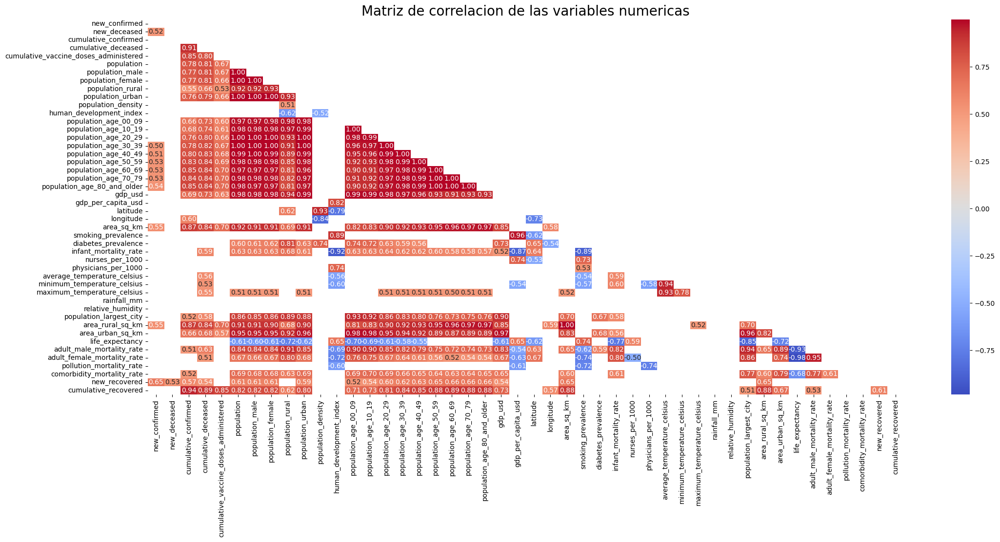

In [14]:
#creacion de la matriz de correlacion de las variables numericas
numeric_columns = data_latinoamerica_paises.select_dtypes(include=['float64','int64']).columns
correlation_matrix = data_latinoamerica_paises[numeric_columns].corr()

#creacion de mascara para el triangulo superior
mask = np.triu( np.ones_like(correlation_matrix, dtype=bool))

#valores superiores a 0.5 es decir , donde hay una correlacion fuerte sin embargo tambien se puede mostrar valores negativos.

correlation_matrix= correlation_matrix[abs(correlation_matrix) > abs(0.5)]

#GRAFICO
plt.figure(figsize =(25,10))#TAMAÑO
heatmap = sns.heatmap(correlation_matrix,mask=mask,annot=True,cmap='coolwarm',fmt='.2f')
plt.title('Matriz de correlacion de las variables numericas', fontsize=20 ) #TITULO Y TAMAÑO DE FUENTE DE TITULO
plt.show()

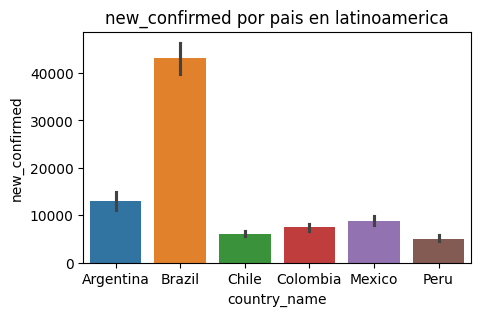

In [16]:
fig,ax = plt.subplots (figsize=(5,3)) #TAMAÑO GRAFICO
sns.barplot(x= 'country_name', y= 'new_confirmed',data= data_latinoamerica_paises, ax=ax,hue='country_name') #DATOS
plt.title('new_confirmed por pais en latinoamerica')#TITULO
plt.show()#MOSTRAR GRAFICO

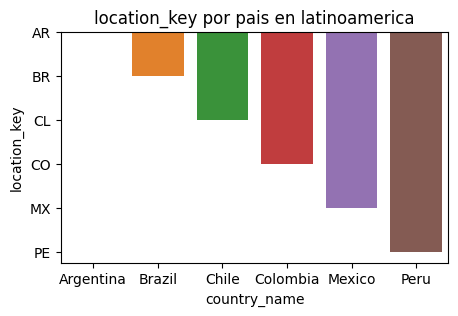

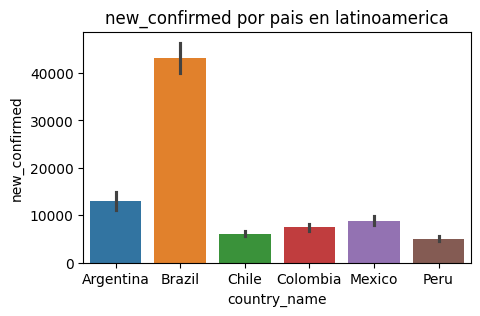

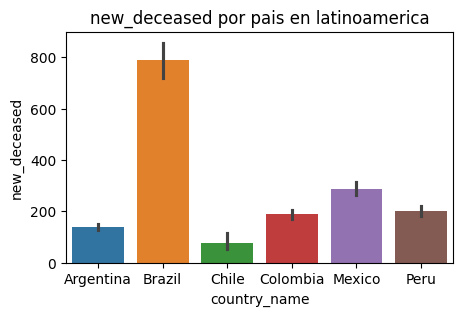

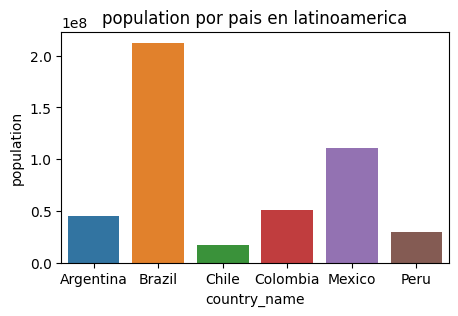

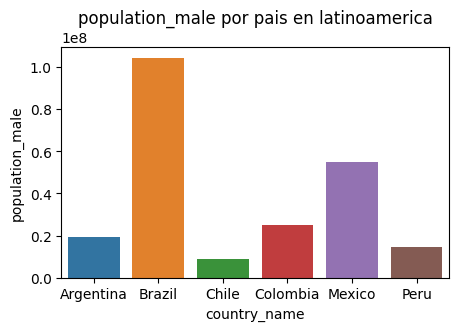

...

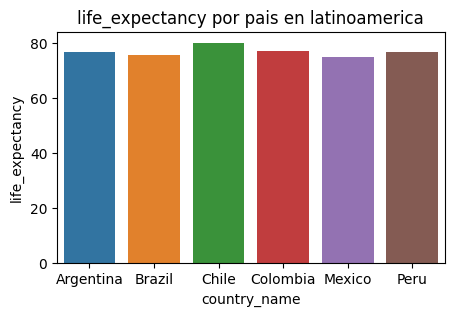

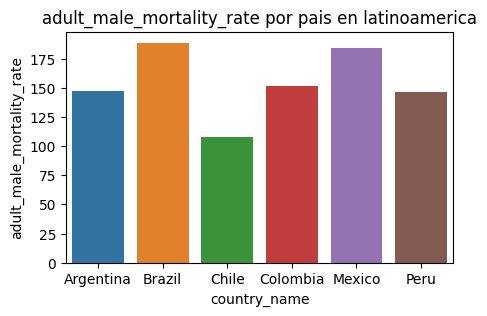

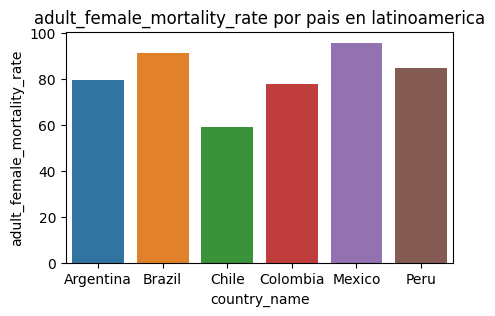

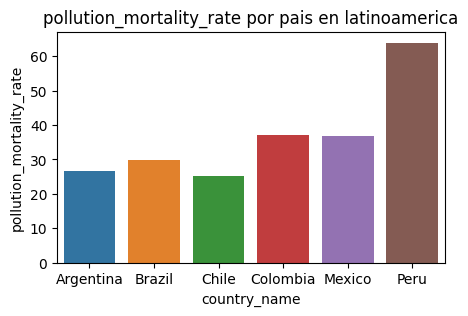

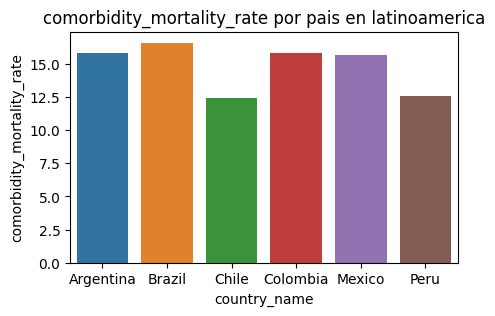

In [17]:
# Diagrama bar para cada pais 
for i in data_latinoamerica_paises.columns:
    if i not in  ['location key','date','country_code','country_name','latitude','longitude','cumulative_confirmed',
                  'cumulative_deceased','cumulative_recovered','cumulative_vaccine_doses_administered','new_recovered']:
        fig, ax = plt.subplots (figsize = (5,3))
        sns.barplot(x='country_name', y=i , data= data_latinoamerica_paises,ax=ax ,hue='country_name')
        plt.title(f'{i} por pais en latinoamerica')
        plt.show ()

Se repite el proceso con un ciclo for pero ahora vamos a realizar histogramas para ver la distribucion de algunos de los datos.

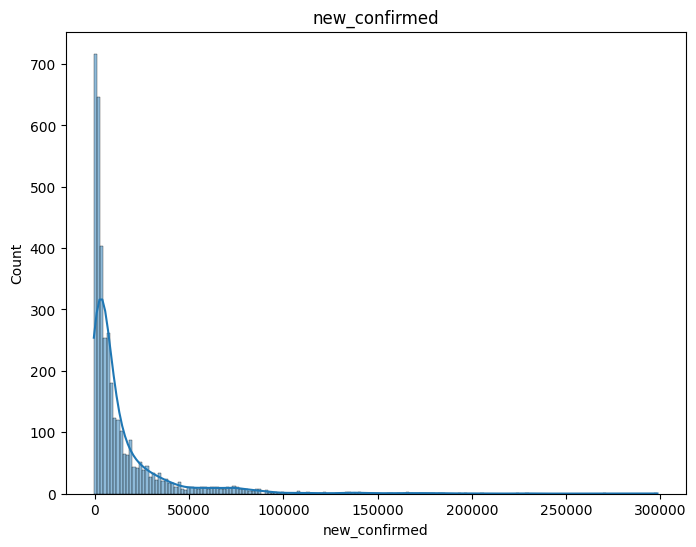

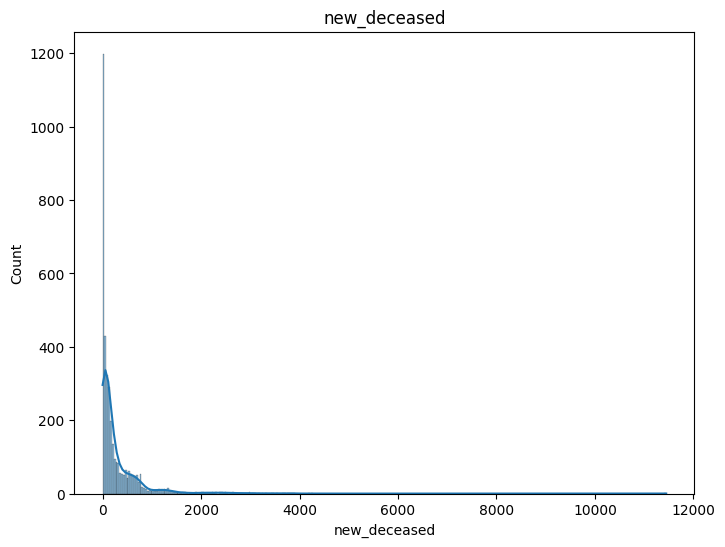

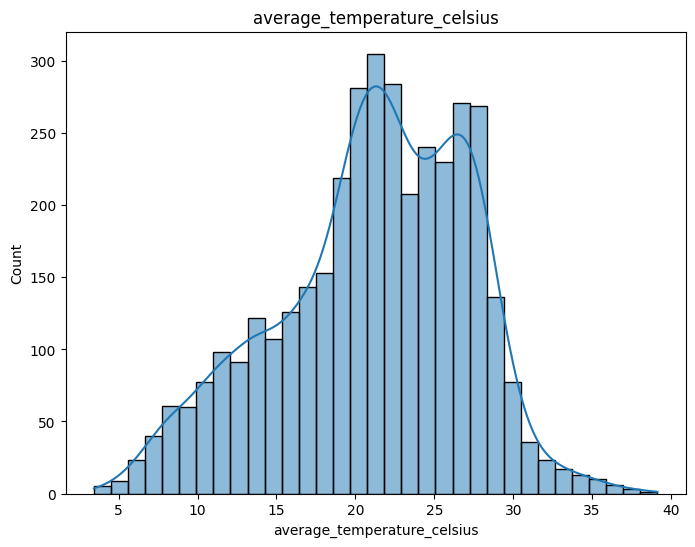

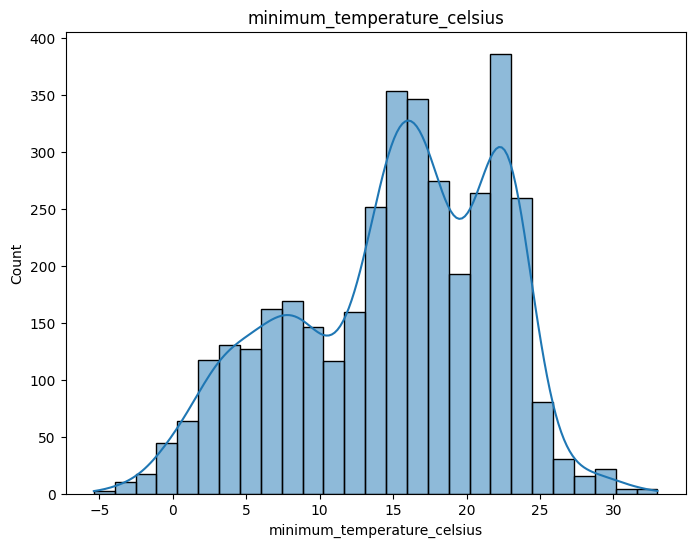

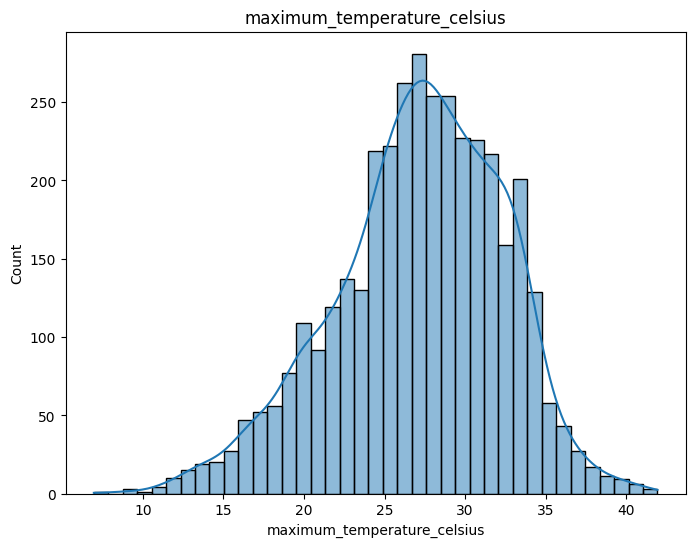

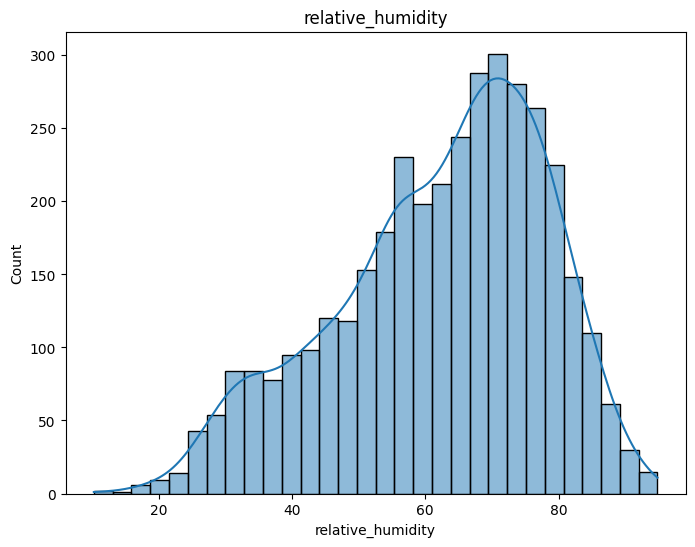

In [19]:
lista_columnas_6 = ['new_confirmed','new_deceased','average_temperature_celsius','minimum_temperature_celsius',
                    'maximum_temperature_celsius','relative_humidity']

# creacion de histogramas de las variables numericas 
for i in data_latinoamerica_paises[lista_columnas_6]:
    if i not in ['location_key','date','country_code','country_name','latitude','longitude','cumulative_confirmed','cumulative_deceased',
                 'cumulative_recovered','cumulative_vaccine_doses_administered']:
        fig.ax = plt.subplots(figsize=(8,6))
        sns.histplot(data_latinoamerica_paises[i], kde= True)
        plt.title(i)
        plt.show()

Procedemos a realizar un analisis enfocado en algunas variables especificas, en este caso vamos a analizar la variable average_temperature y la variable new_confirmed, con el fin de tratar de entender el comportamiento de los casos respecto a la temperatura.

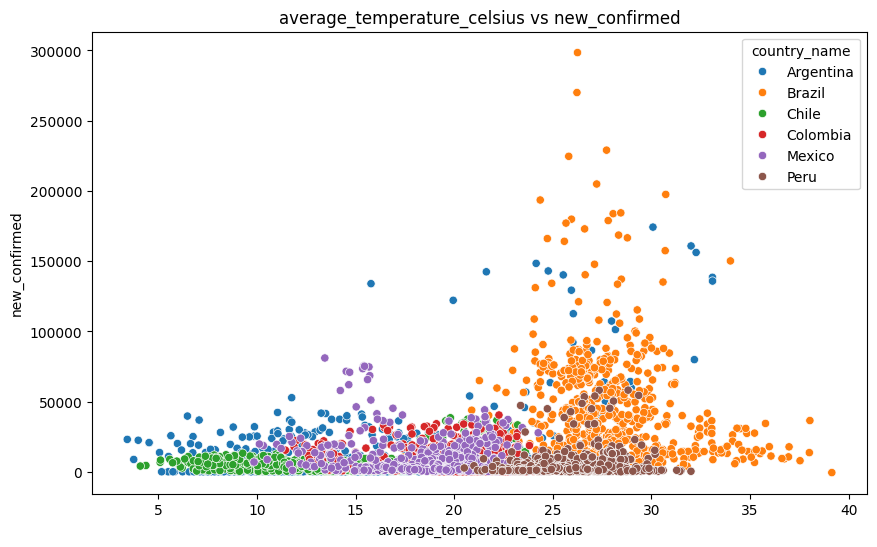

In [20]:
#Grafica de average_temperature_celsius vs new_confirmed
fig, ax= plt.subplots(figsize=(10,6))
sns.scatterplot(x='average_temperature_celsius', y = 'new_confirmed', data=data_latinoamerica_paises, hue= 'country_name')
plt.title('average_temperature_celsius vs new_confirmed')
plt.show()

Se ha podido obtener visualizaciones dando a revelar que en algunos paises la temperatura no influye en la cantidad de casos confirmados ,sin embargo en otros paises si se puede observar una relacion entre la temperatura y la cantidad de casos confirmados de covid.

Como vimos que la temperatura tiene alguna relacion con los casos confirmados vamos a relizar un analisis de la temperatura promedio con la cantidad de muertes.

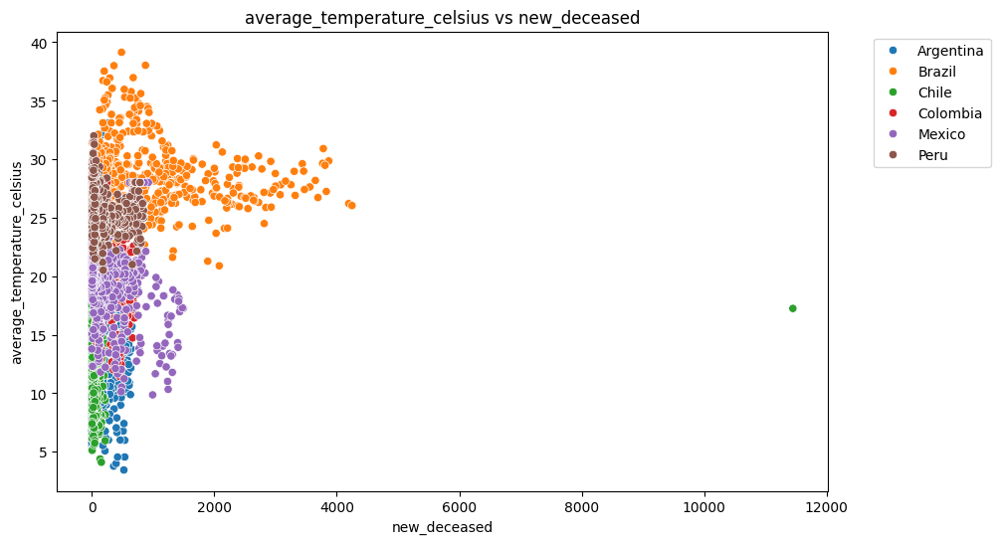

In [21]:
#Grafica de average_temperature_celsius vs new_deceased
fig, ax= plt.subplots(figsize=(10,6))
sns.scatterplot( y = 'average_temperature_celsius', x ='new_deceased',data=data_latinoamerica_paises, hue= 'country_name')
plt.title('average_temperature_celsius vs new_deceased')
plt.legend(bbox_to_anchor=(1.05,1), loc ='upper left')
plt.show()

En el grafico anterior se ve un comportamiento similar al de los casos confirmados,en algunos paises la temperatura no influye en la cantidad de muertes , sin embargo en otros paises si se puede observar una relacion entre la temperatura y la cantidad de muertes.

A continuacion vamos a ver como se comportan las variables en un estudio longitudinal a lo largo del tiempo
vamos a observar las administradas por MES en todos los PAISES

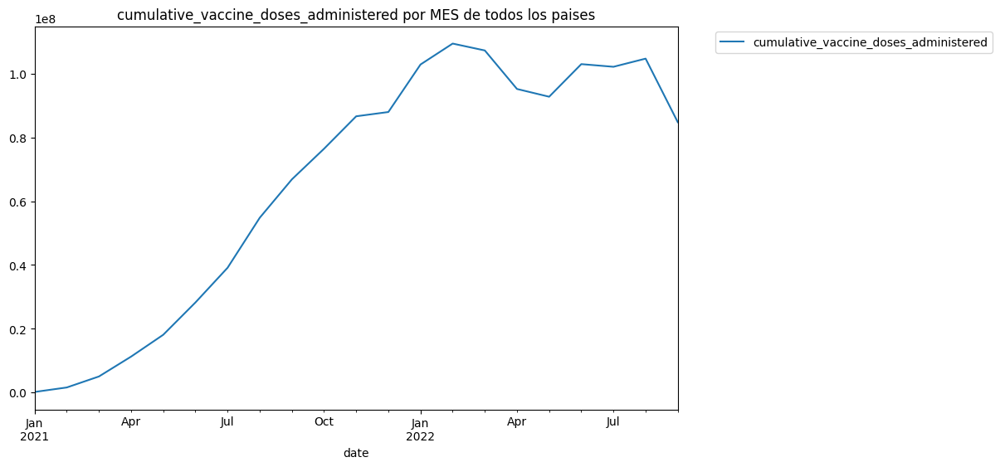

In [22]:
# Grafica de valores medios de todos los paises cumulative_vaccine_doses_administered
#USAMOS RESAMPLE EN LUGAR DE GROUP BY YA QUE NOS PERMITE REALIZAR MULTIPLES VARIACIONES EN EL TIEMPO
#'ME' = MENSUAL
#MEAN=PROMEDIO
fig, ax = plt.subplots(figsize=(10,6))
data_latinoamerica_paises.resample('ME').mean(numeric_only=True)['cumulative_vaccine_doses_administered'].plot()
plt.legend(bbox_to_anchor=(1.05,1), loc='upper left')
plt.title('cumulative_vaccine_doses_administered por MES de todos los paises')
plt.show()

En el grafico de arriba se puede observar que la cantidad de dosis administradas en los paises seleccionados ha ido aumentado a lo largo del tiempo, recordemos que es un analisis general y no detallado, por eso no nos da demasiada informacion, por lo cual, a continuacion vamos a realizar un analisis mas detallado de las dosis administradas por MES EN CADA PAIS.

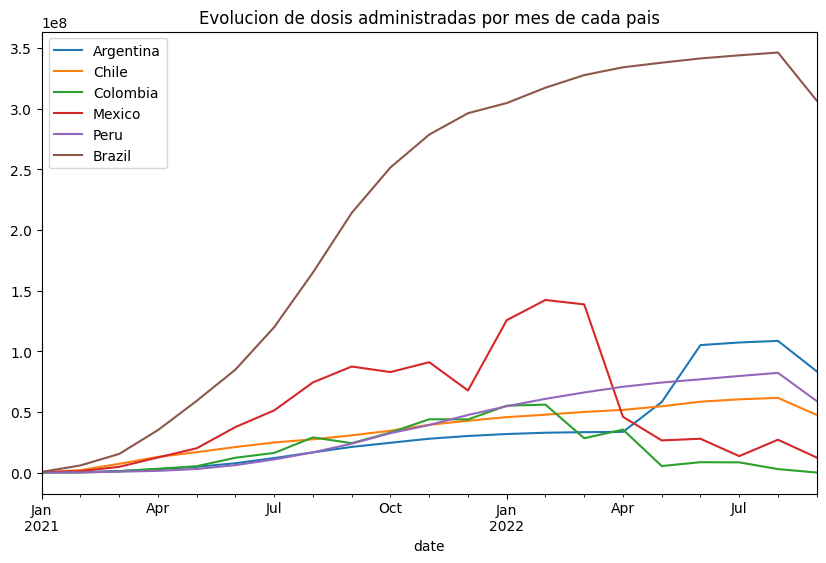

In [26]:
#Utilizamos parte del codigo del grafico anterior pero esta vez le agregamos los paises seleccionados
fig, ax = plt.subplots(figsize=(10,6))
for pais in paises_seleccionados:
    data_latinoamerica_paises[data_latinoamerica_paises['country_name']==pais].resample('ME').mean(numeric_only=True)['cumulative_vaccine_doses_administered'].plot()

plt.title('Evolucion de dosis administradas por mes de cada pais')
plt.legend(bbox_to_anchor=(1.05,1), loc='upper left')
plt.legend(paises_seleccionados)
plt.show()

Si realizamos un analisis mas detallado de las dosis administradas por mes en cada pais , podemos observar que en algunos paises la cantidad de dosis administradas ha ido aumentando a lo largo del tiempo, sin embargo en otros paises la cantidad de dosis administradas ha ido disminuyendo , esto puede ser debido a muchos factores, como la cantidad de vacunas disponibles,la cantidad de personas que se han vacunado,entre otros.

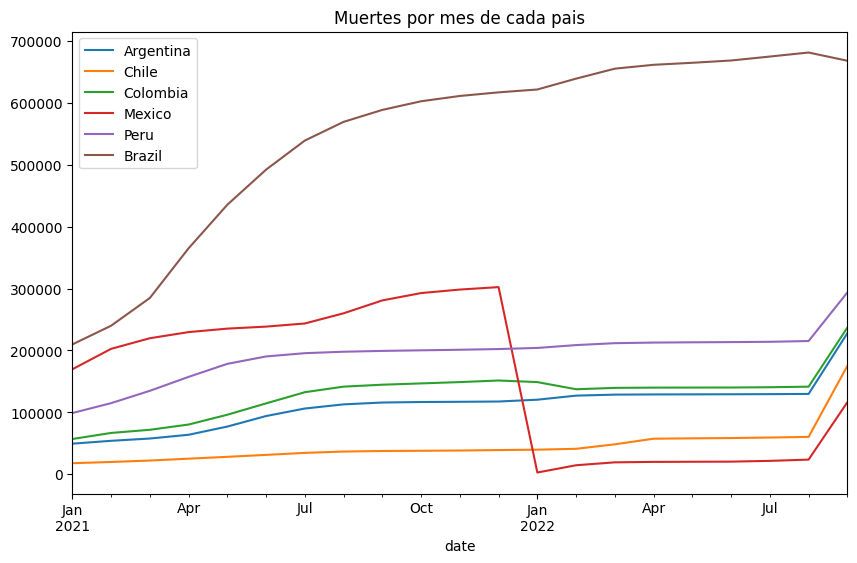

In [28]:
fig, ax = plt.subplots(figsize=(10,6))
for pais in paises_seleccionados:
    data_latinoamerica_paises[data_latinoamerica_paises['country_name']==pais].resample('ME').mean(numeric_only=True)['cumulative_deceased'].plot()

plt.title('Muertes por mes de cada pais')
plt.legend(bbox_to_anchor=(1.05,1), loc='upper left')
plt.legend(paises_seleccionados)
plt.show()

El pais que mas muertes ha tenido es Brasil, seguido de Mexico,Colombia,Argentina,Peru y Chile. Sin embargo, esto no quiere decir que estos paises sean los que peor han manejado la pandemia , ya que hay que tener en cuenta la cantidad de habitantes de cada pais ademas de otros factores y cantidad de datos que tenemos.
La disminucion de casos en Mexico puede ser una perdida de datos o una disminucion real de casos, esto se puede analizar en un analisis posterior.

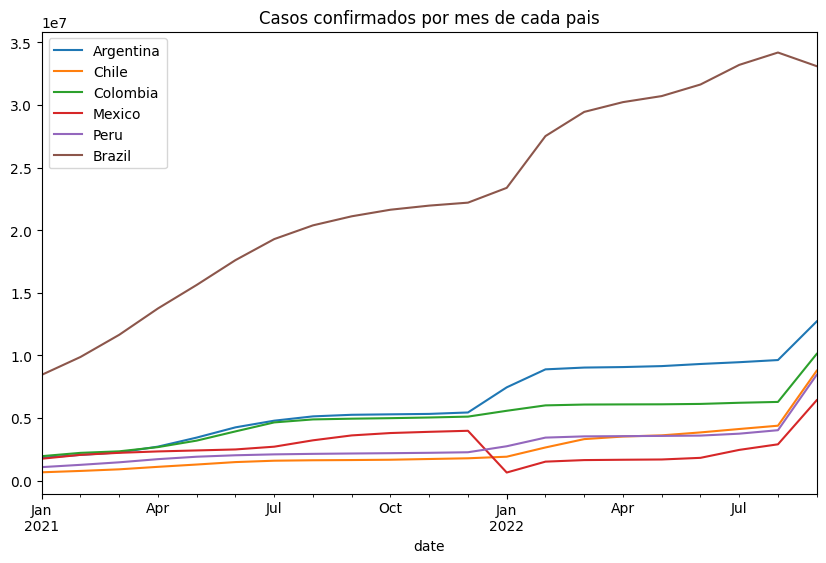

In [29]:
fig, ax = plt.subplots(figsize=(10,6))
for pais in paises_seleccionados:
    data_latinoamerica_paises[data_latinoamerica_paises['country_name']==pais].resample('ME').mean(numeric_only=True)['cumulative_confirmed'].plot()

plt.title('Casos confirmados por mes de cada pais')
plt.legend(bbox_to_anchor=(1.05,1), loc='upper left')
plt.legend(paises_seleccionados)
plt.show()

El pais que mejor se recupero ha sido Brasil, sin embargo esto viene relacionado a la cantidad de personas y vacunas disponibles.

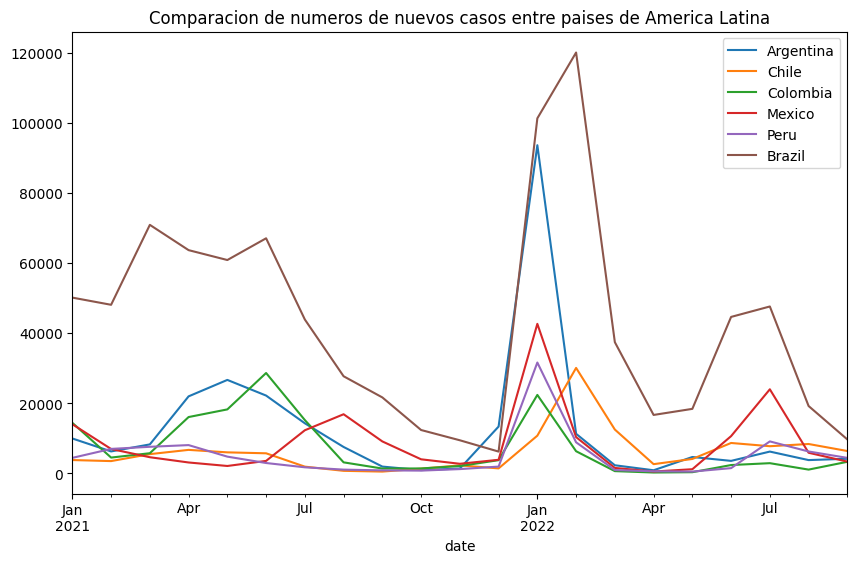

In [30]:
fig, ax = plt.subplots(figsize=(10,6))
for pais in paises_seleccionados:
    data_latinoamerica_paises[data_latinoamerica_paises['country_name']==pais].resample('ME').mean(numeric_only=True)['new_confirmed'].plot()

plt.title('Comparacion de numeros de nuevos casos entre paises de America Latina')
plt.legend(bbox_to_anchor=(1.05,1), loc='upper left')
plt.legend(paises_seleccionados)
plt.show()

De estos paises, el que mejor manejo la pandemia fue Chile, seguido de Peru,Argentina,Colombia,Mexico y Brasil, se puede observar que la cantidad de muertes y casos confirmados es menor en estos paises ademas de no ser tan desproporcionada la cantidad de vacunas administradas.

Text(0.5, 1.0, 'Distribucion de dosis Acumuladas por Pais')

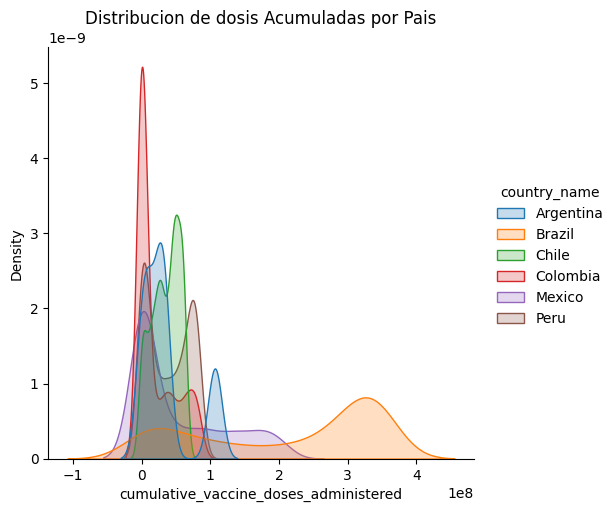

In [31]:
sns.displot(data_latinoamerica_paises, x='cumulative_vaccine_doses_administered' , hue='country_name', kind='kde',fill= True)
plt.title('Distribucion de dosis Acumuladas por Pais')

De los paises que peor manejaron la pandemia fue Brasil, seguido de Mexico,Colombia,Argentina,Peru y Chile, se puede observar que la cantidad de muertes y casos confirmados es mayor en estos paises ademas de ser desproporcionada la cantidad de vacunas administradas.

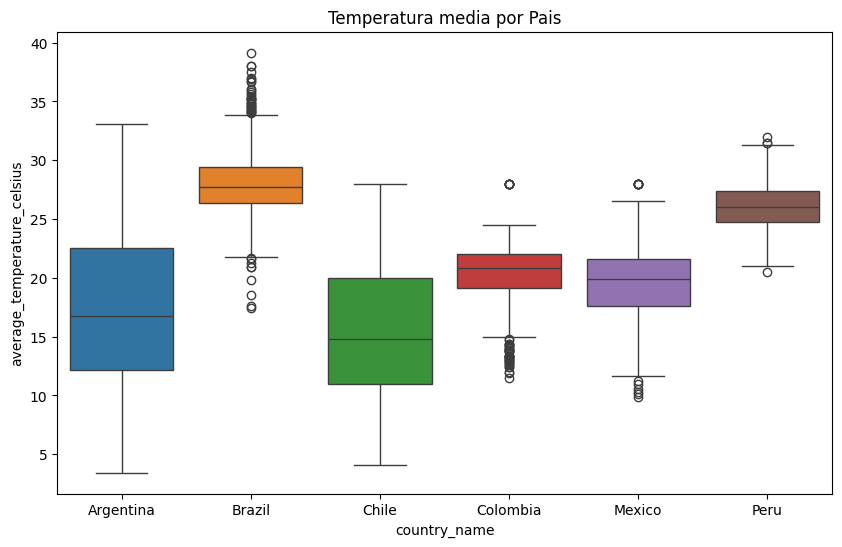

In [32]:
#average_temperature_celsius vs new_confirmed por pais boxplot
fig ,ax= plt.subplots(figsize=(10,6))
sns.boxplot(x='country_name', y ='average_temperature_celsius',data=data_latinoamerica_paises,hue='country_name')
plt.title('Temperatura media por Pais')
plt.show()

Aunque  Chile tiene rangos diferentes de temperatura y eso podria haber afectado la cantidad de casos confirmados y muertes, se puede observar que chile ha manejado mejor la pandemia que los demas paises , Brasil por ejemplo, presenta valores ATIPICOS(estan por ensima de la linea)
Esto nos ha llevado a la conclusion de que los paises donde se podria crear los nuevos centros serian donde hay mas casos confirmados y muertes , ya que es donde se necesita mas ayuda.
Pese a nuestro anterior analisis,no podemos tomar una decision definitiva, ya que no hemos realizado un analisis detallado de los datos, por lo que se recomienda hacer un analisis mas detallado y un estudio de los datos para poder tomar una decision mas acertada. 

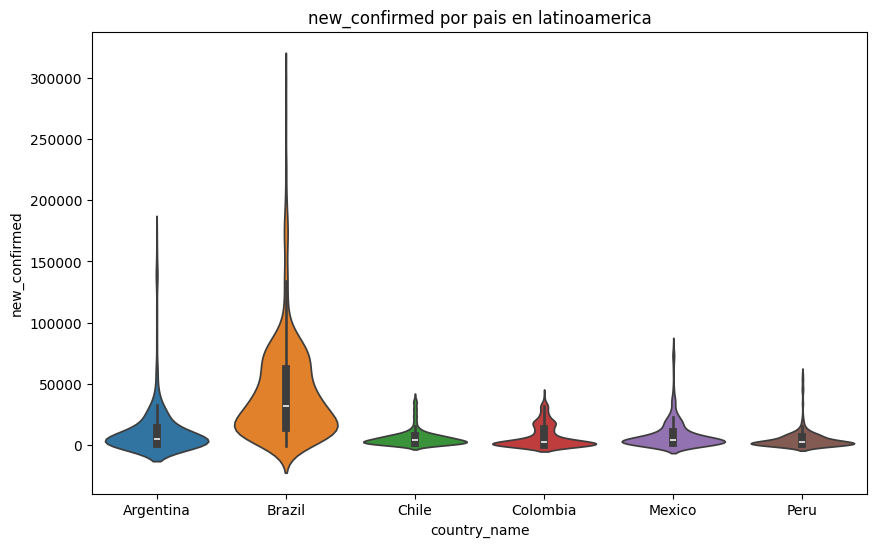

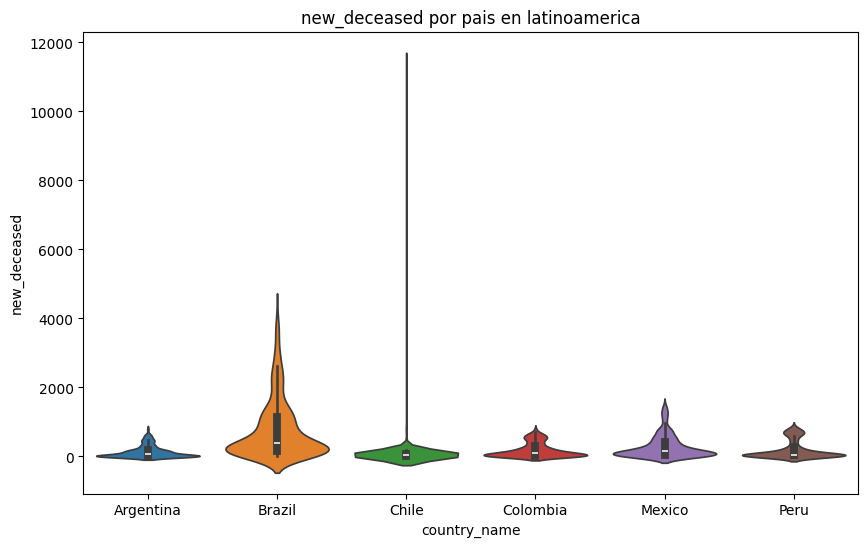

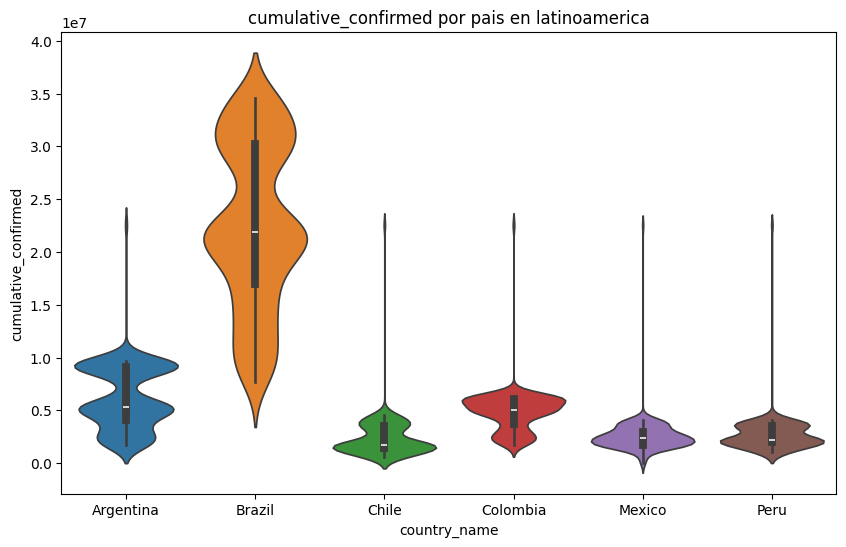

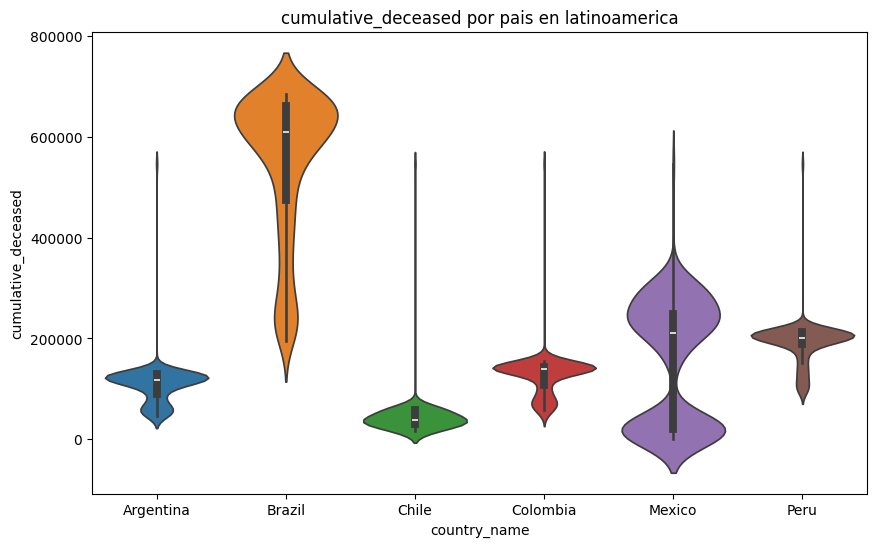

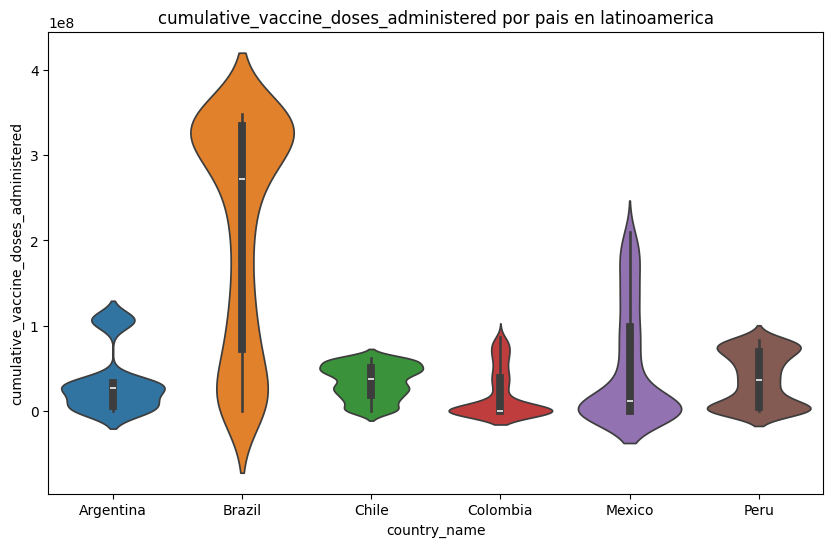

...

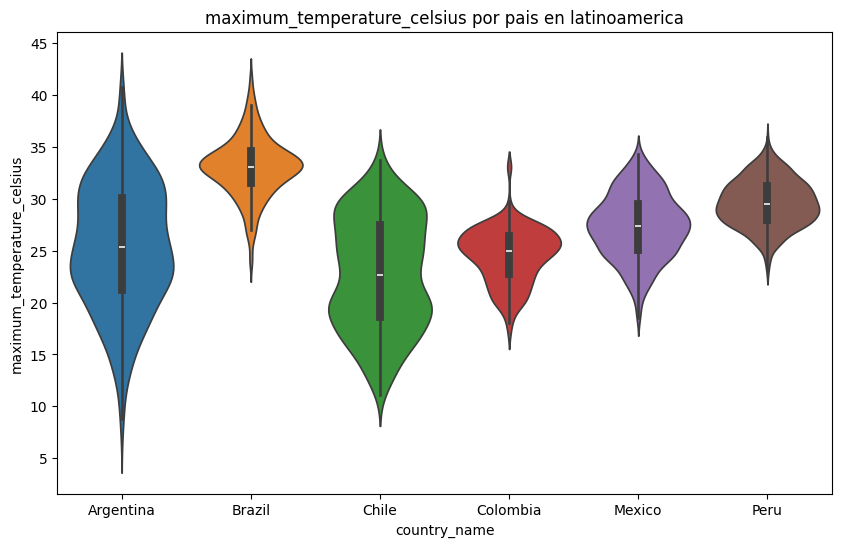

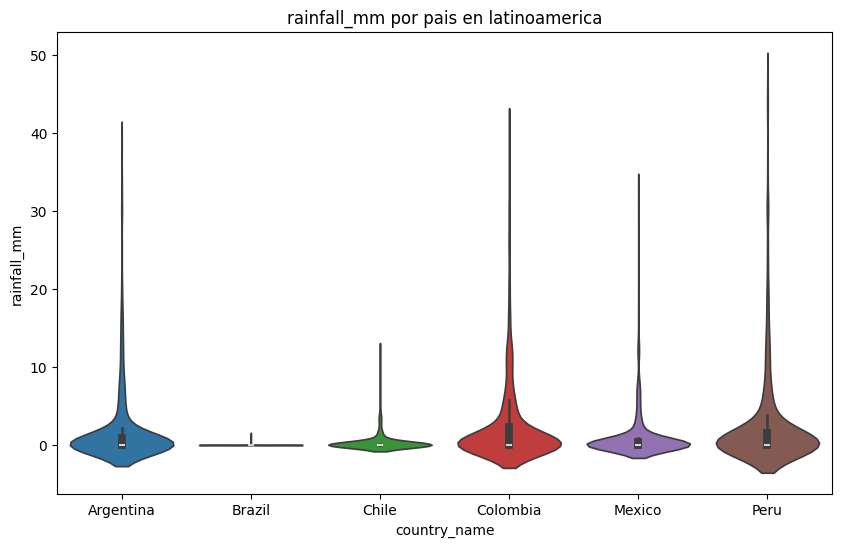

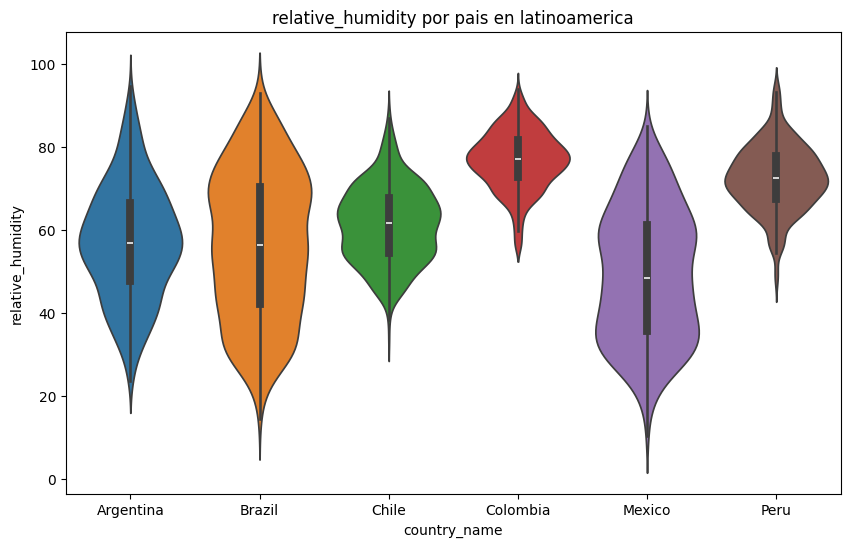

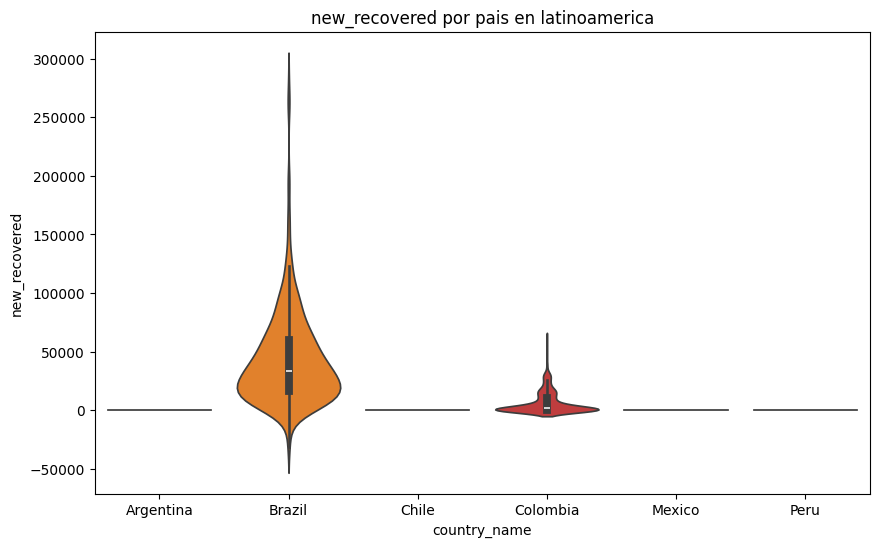

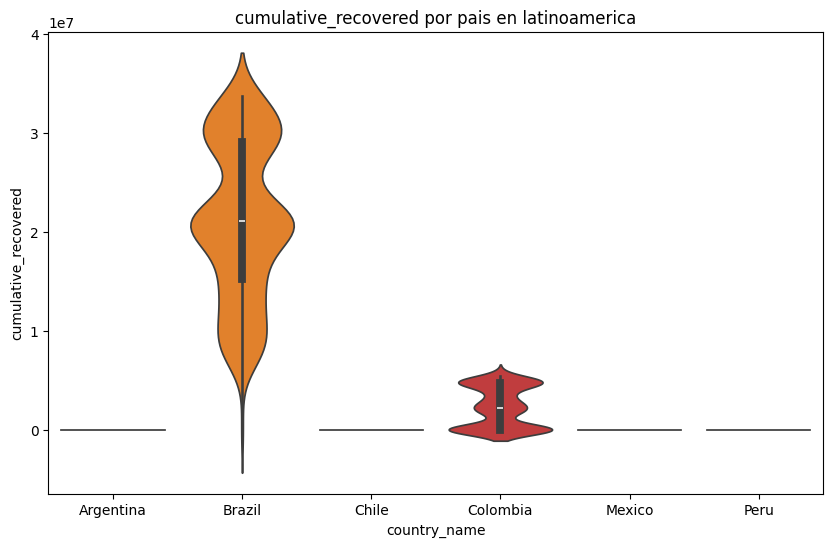

In [33]:
#Se crea un dataframe con las columnas mayores a 6 porque son las que tienen valores diferentes para cada pais.
#nunique = numero de valores unicos
columnas_mayores_6=[]
for i in data_latinoamerica_paises.columns:
    if i not in ['location_key','date','country_code','latitude','longitude']:
        if data_latinoamerica_paises[i].nunique()>6:
            columnas_mayores_6.append(i)
# Agregar a columnas_mayores_6 la columna country_name para poder hacer analisis por pais.
columnas_mayores_6.append('country_name')

#Se crea un dataframe con las columnas mayores a 6
data_latinoamerica_paises_mayores_6=data_latinoamerica_paises[columnas_mayores_6]  

#Violinplot en todos los paises para variables numericas
for i in data_latinoamerica_paises_mayores_6.columns:
    if i not in ['location_key','date','country_code','latitude','longitude','country_name']:
        fig ,ax= plt.subplots(figsize=(10,6))
        sns.violinplot(x='country_name', y =i ,data=data_latinoamerica_paises_mayores_6,hue='country_name')
        plt.title(f'{i} por pais en latinoamerica')
        plt.show() 


Analizamos la distribucion de la poblacion por grupos de edad en los paises seleccionados,para tratar de entender como se comporta la poblacion en cada pais y en un futuro poder tomar decisiones mas acertadas.

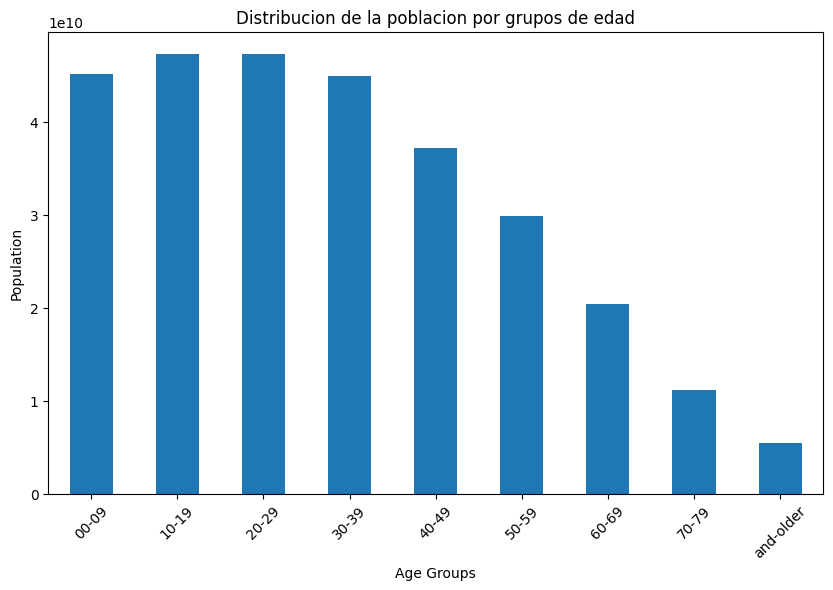

In [34]:
#calculamos la distribucion de la poblacion por grupos de edad 
age_columns = ['population_age_00_09','population_age_10_19','population_age_20_29','population_age_30_39','population_age_40_49','population_age_50_59','population_age_60_69','population_age_70_79','population_age_80_and_older']
age_distribution= data_latinoamerica_paises[age_columns].sum()

plt.figure(figsize=(10,6))
age_distribution.plot(kind='bar', stacked=True)
plt.xlabel('Age Groups')
plt.ylabel('Population')
plt.title('Distribucion de la poblacion por grupos de edad')
plt.xticks(range(len(age_columns)),[col.split('_')[-2] + '-' + col.split('_')[-1] for col in age_columns],rotation=45)

plt.show()

Esta grafica nos permite ver la poblacion por grupos de edad en cada pais, lo que nos puede ayudar a entender como se comporta la poblacion y tambien nos genera la idea de que podriamos graficar la cantidad de vacunas por cada grupo etario.

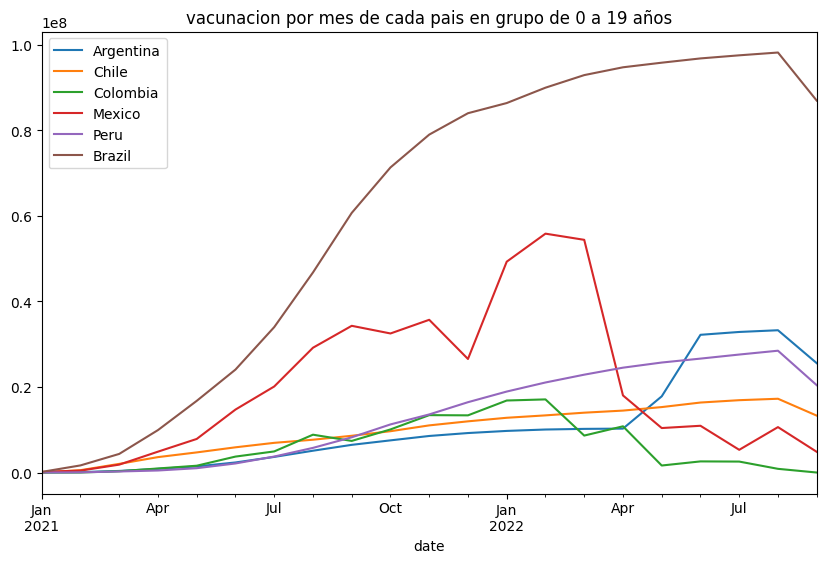

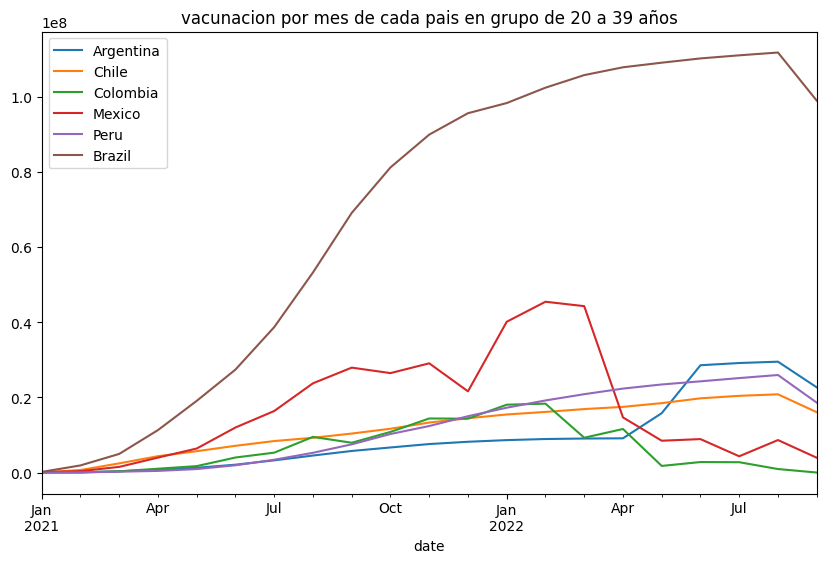

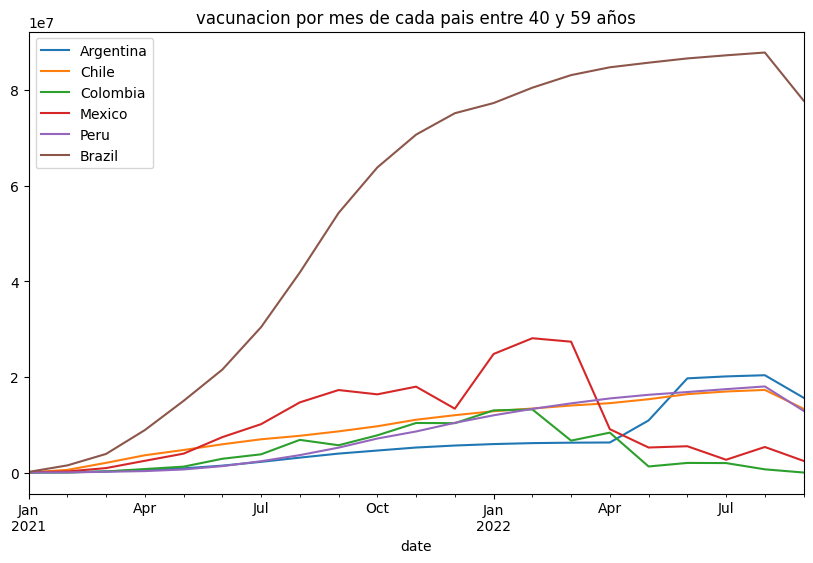

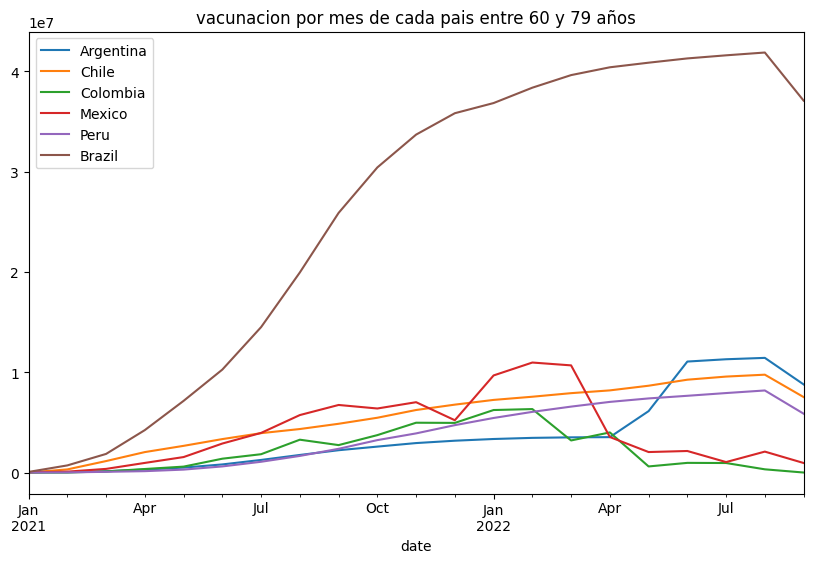

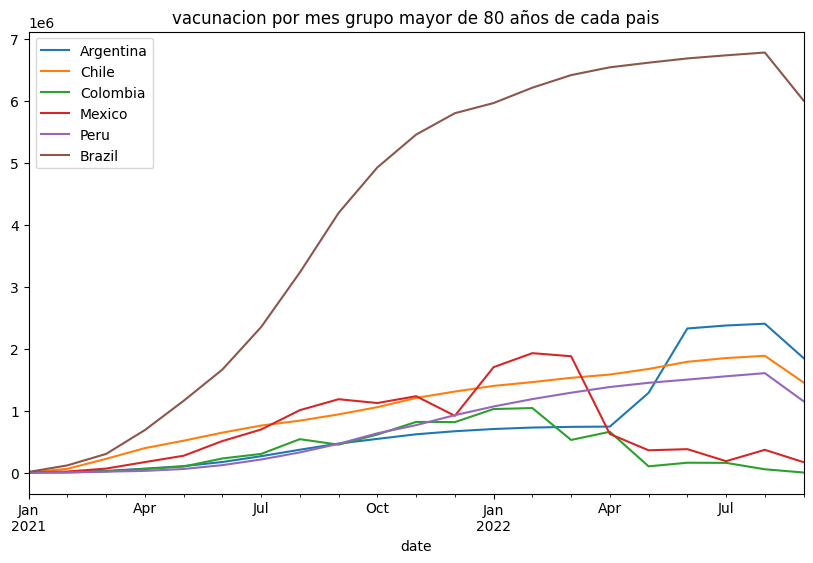

In [35]:
# grupo etereo mas vacunado

data_latinoamerica_paises['population_age_00_19']=data_latinoamerica_paises['population_age_00_09']+data_latinoamerica_paises['population_age_10_19']
data_latinoamerica_paises['population_age_20_39']=data_latinoamerica_paises['population_age_20_29']+data_latinoamerica_paises['population_age_30_39']
data_latinoamerica_paises['population_age_40_59']=data_latinoamerica_paises['population_age_40_49']+data_latinoamerica_paises['population_age_50_59']
data_latinoamerica_paises['population_age_60_79']=data_latinoamerica_paises['population_age_60_69']+data_latinoamerica_paises['population_age_70_79']
data_latinoamerica_paises['population_age_80_and_older']=data_latinoamerica_paises['population_age_80_and_older']

data_latinoamerica_paises['population_age_00_19_vacunados']=data_latinoamerica_paises['cumulative_vaccine_doses_administered']*data_latinoamerica_paises['population_age_00_19']/data_latinoamerica_paises['population']
data_latinoamerica_paises['population_age_20_39_vacunados']=data_latinoamerica_paises['cumulative_vaccine_doses_administered']*data_latinoamerica_paises['population_age_20_39']/data_latinoamerica_paises['population']
data_latinoamerica_paises['population_age_40_59_vacunados']=data_latinoamerica_paises['cumulative_vaccine_doses_administered']*data_latinoamerica_paises['population_age_40_59']/data_latinoamerica_paises['population']
data_latinoamerica_paises['population_age_60_79_vacunados']=data_latinoamerica_paises['cumulative_vaccine_doses_administered']*data_latinoamerica_paises['population_age_60_79']/data_latinoamerica_paises['population']
data_latinoamerica_paises['population_age_80_and_older_vacunados']=data_latinoamerica_paises['cumulative_vaccine_doses_administered']*data_latinoamerica_paises['population_age_80_and_older']/data_latinoamerica_paises['population']


data_latinoamerica_paises['population_age_00_19_vacunados']=data_latinoamerica_paises['population_age_00_19_vacunados'].fillna(0)
data_latinoamerica_paises['population_age_20_39_vacunados']=data_latinoamerica_paises['population_age_20_39_vacunados'].fillna(0)
data_latinoamerica_paises['population_age_40_59_vacunados']=data_latinoamerica_paises['population_age_40_59_vacunados'].fillna(0)
data_latinoamerica_paises['population_age_60_79_vacunados']=data_latinoamerica_paises['population_age_60_79_vacunados'].fillna(0)
data_latinoamerica_paises['population_age_80_and_older_vacunados']=data_latinoamerica_paises['population_age_80_and_older_vacunados'].fillna(0)


data_latinoamerica_paises['population_age_00_19_vacunados']=data_latinoamerica_paises['population_age_00_19_vacunados'].astype(int)
data_latinoamerica_paises['population_age_20_39_vacunados']=data_latinoamerica_paises['population_age_20_39_vacunados'].astype(int)
data_latinoamerica_paises['population_age_40_59_vacunados']=data_latinoamerica_paises['population_age_40_59_vacunados'].astype(int)
data_latinoamerica_paises['population_age_60_79_vacunados']=data_latinoamerica_paises['population_age_60_79_vacunados'].astype(int)
data_latinoamerica_paises['population_age_80_and_older_vacunados']=data_latinoamerica_paises['population_age_80_and_older_vacunados'].astype(int)

data_latinoamerica_paises['population_age_00_19_vacunados'].sum()
data_latinoamerica_paises['population_age_20_39_vacunados'].sum()
data_latinoamerica_paises['population_age_40_59_vacunados'].sum()
data_latinoamerica_paises['population_age_60_79_vacunados'].sum()
data_latinoamerica_paises['population_age_80_and_older_vacunados'].sum()

#Grafica de valores medios de todos los paises cumulative_doses_administered
#GRAFICO
fig,ax =plt.subplots(figsize=(10,6))#TAMAÑO
for pais in paises_seleccionados:
    data_latinoamerica_paises[data_latinoamerica_paises['country_name']==pais].resample('ME').mean(numeric_only=True)['population_age_00_19_vacunados'].plot()
plt.title('vacunacion por mes de cada pais en grupo de 0 a 19 años')#DATOS
plt.legend(bbox_to_anchor=(1.05,1), loc='upper left')
plt.legend(paises_seleccionados)
plt.show()#MOSTRAR
#GRAFICO
fig,ax =plt.subplots(figsize=(10,6))#TAMAÑO
for pais in paises_seleccionados:#DATOS
    data_latinoamerica_paises[data_latinoamerica_paises['country_name']==pais].resample('ME').mean(numeric_only=True)['population_age_20_39_vacunados'].plot()
plt.title('vacunacion por mes de cada pais en grupo de 20 a 39 años')#TITULO
plt.legend(bbox_to_anchor=(1.05,1), loc='upper left')
plt.legend(paises_seleccionados)
plt.show()#MOSTRAR
#GRAFICO
fig,ax =plt.subplots(figsize=(10,6))#TAMAÑO
for pais in paises_seleccionados:#DATOS
    data_latinoamerica_paises[data_latinoamerica_paises['country_name']==pais].resample('ME').mean(numeric_only=True)['population_age_40_59_vacunados'].plot()
plt.title('vacunacion por mes de cada pais entre 40 y 59 años')
plt.legend(bbox_to_anchor=(1.05,1), loc='upper left')
plt.legend(paises_seleccionados)
plt.show()
#GRAFICO
fig,ax =plt.subplots(figsize=(10,6))#TAMAÑO
for pais in paises_seleccionados:#DATOS
    data_latinoamerica_paises[data_latinoamerica_paises['country_name']==pais].resample('ME').mean(numeric_only=True)['population_age_60_79_vacunados'].plot()
plt.title('vacunacion por mes de cada pais entre 60 y 79 años')
plt.legend(bbox_to_anchor=(1.05,1), loc='upper left')
plt.legend(paises_seleccionados)
plt.show()
#GRAFICO
fig,ax =plt.subplots(figsize=(10,6))#GRAFICO Y TAMAÑO
for pais in paises_seleccionados:#DATOS
    data_latinoamerica_paises[data_latinoamerica_paises['country_name']==pais].resample('ME').mean(numeric_only=True)['population_age_80_and_older_vacunados'].plot()
plt.title('vacunacion por mes grupo mayor de 80 años de cada pais')#TITULO
plt.legend(bbox_to_anchor=(1.05,1), loc='upper left')
plt.legend(paises_seleccionados)
plt.show()#MOSTRAR GRAFICOS

Mortalidad por genero para identificar la poblacion mas vulnerable en cada pais ,con esto ya podriamos tener una idea de cual serian la poblacion a vacunar primero.

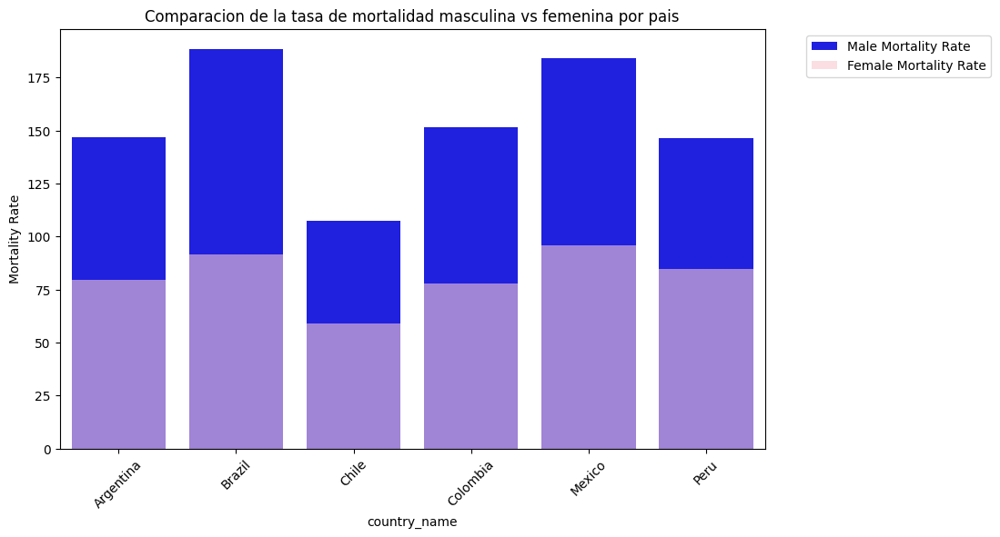

In [40]:
#Grafica de mortalidad por genero
plt.figure(figsize=(10,6))# TAMAÑO DEL GRAFICO
sns.barplot(data_latinoamerica_paises, x= 'country_name',y='adult_male_mortality_rate',color='blue',label='Male Mortality Rate')#DATOS
sns.barplot(data_latinoamerica_paises, x= 'country_name',y='adult_female_mortality_rate',color='pink',alpha=0.6, label='Female Mortality Rate')#DATOS
plt.xticks(rotation=45)#ROTACION DE 45 GRADOS
plt.ylabel('Mortality Rate')
plt.title('Comparacion de la tasa de mortalidad masculina vs femenina por pais')#TITULO
plt.legend(bbox_to_anchor=(1.05,1), loc='upper left')
plt.show()

De acuerdo a la grafica de mortalidad se puede observar que en todos los paises la cantidad de muertes es mayor en los hombres que en las mujeres, por lo que se podria decir que los hombres son mas vulnerables a la enfermedad o estan menos protegidos.

Y si vemos las enfermedades preexistentes o comorbolidades? Podriamos ver si hay alguna enfermedad que sea mas comun en los paises seleccionados y que haya causado mas muertes.

Veamos a ver si existe de una manera mas detallada las variables y la correlacion entre ellos.

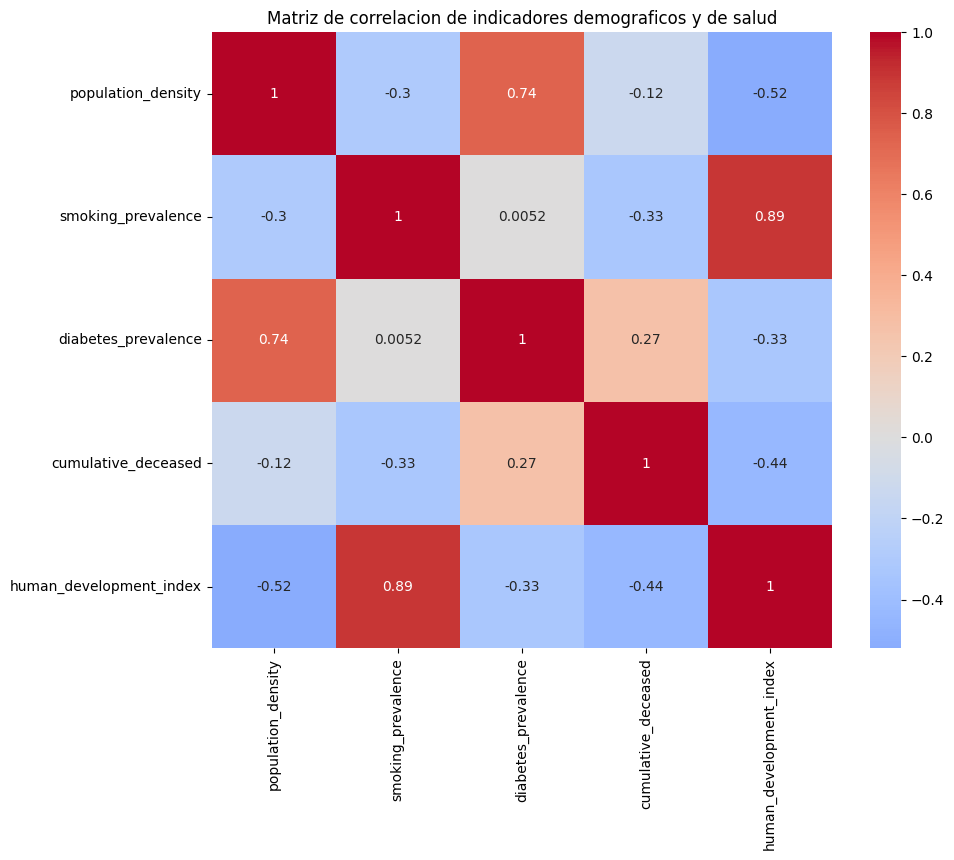

In [42]:
#Selecting a subjset of columns for correlation analisis.
columns = ['population_density','smoking_prevalence','diabetes_prevalence','cumulative_deceased','human_development_index']
correlation_matrix = data_latinoamerica_paises[columns].corr()
plt.figure(figsize=(10,8))#MEDIDAS
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', center=0)
plt.title('Matriz de correlacion de indicadores demograficos y de salud')#TITULO
plt.show()


De esta matriz  podemos observar que el fumar y tener diabetes son las enfermedades preexistentes que mas afectan a la poblacion en los paises seleccionados, por lo que se podria decir que estas enfermedades son las que mas han causado muertes en los paises seleccionados,sin embargo esto no quiere decir que sean las unicas enfermedades que han causado muertes sino que son las mas comunes.
De acuerdo a esto , vamos a ver como se comporta la mortalidad en los paises seleccionados por enfermedades preexistentes o comorbilidades.

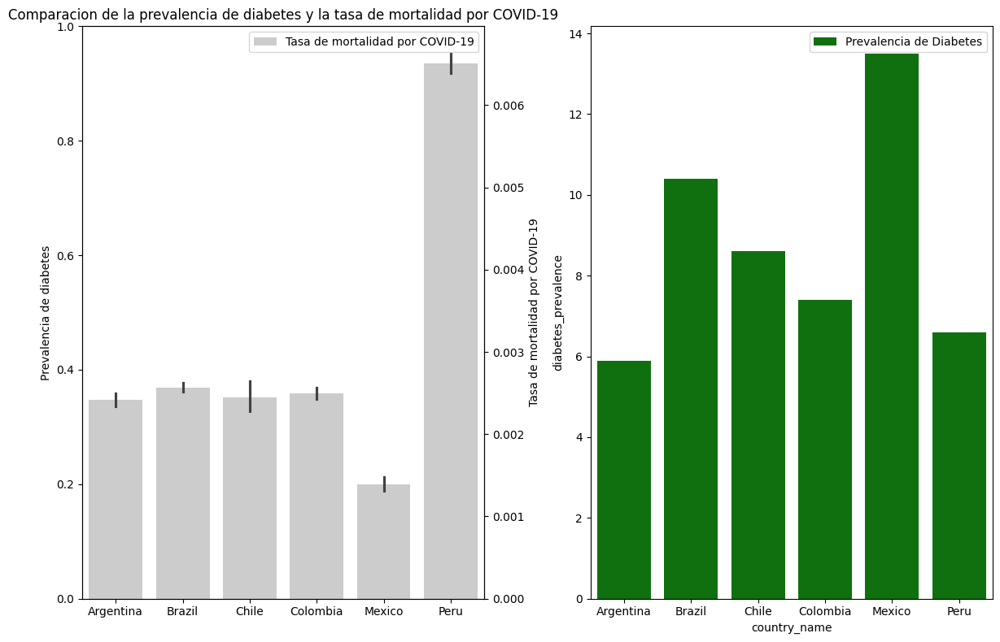

In [44]:
fig, (ax,ax2) = plt.subplots(1,2, figsize=(12,8)) #GRAFICO,(AX=EJES) Y TAMAÑO DEL GRAFICO
sns.barplot(data=data_latinoamerica_paises, x = data_latinoamerica_paises['country_name'], y =data_latinoamerica_paises['diabetes_prevalence'],color='green',label='Prevalencia de Diabetes')
ax2 = ax.twinx()
sns.barplot(data=data_latinoamerica_paises, x =data_latinoamerica_paises['country_name'], y=data_latinoamerica_paises['cumulative_deceased'] / data_latinoamerica_paises['population'], color='grey',label='Tasa de mortalidad por COVID-19', ax=ax2,alpha=0.4)
plt.xticks(rotation=90)#DATOS SELECCIONADOS
ax.set_ylabel('Prevalencia de diabetes')
ax2.set_ylabel('Tasa de mortalidad por COVID-19')
plt.title('Comparacion de la prevalencia de diabetes y la tasa de mortalidad por COVID-19')#TITULO
plt.tight_layout()
plt.show()#MOSTRAR GRAFICO

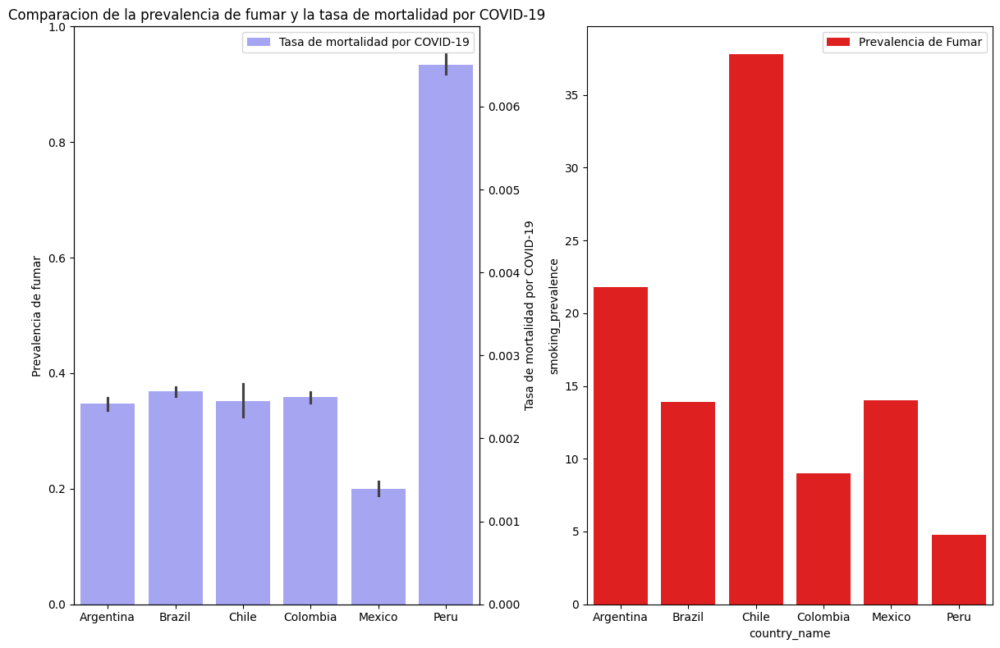

In [46]:
fig, (ax,ax2) = plt.subplots(1,2, figsize=(12,8))
sns.barplot(data=data_latinoamerica_paises, x = data_latinoamerica_paises['country_name'], y =data_latinoamerica_paises['smoking_prevalence'],color='red',label='Prevalencia de Fumar')
ax2 = ax.twinx()
sns.barplot(data=data_latinoamerica_paises, x =data_latinoamerica_paises['country_name'], y=data_latinoamerica_paises['cumulative_deceased'] / data_latinoamerica_paises['population'], color='blue',label='Tasa de mortalidad por COVID-19', ax=ax2,alpha=0.4)
plt.xticks(rotation=90)
ax.set_ylabel('Prevalencia de fumar')
ax2.set_ylabel('Tasa de mortalidad por COVID-19')
plt.title('Comparacion de la prevalencia de fumar y la tasa de mortalidad por COVID-19')
plt.tight_layout()
plt.show()

AVANCE 3

Analizamos el comportamiento de manera semanal y anual , para esto vamos a agrupar los datos por semana y por año para que recordemos como usar groupby.

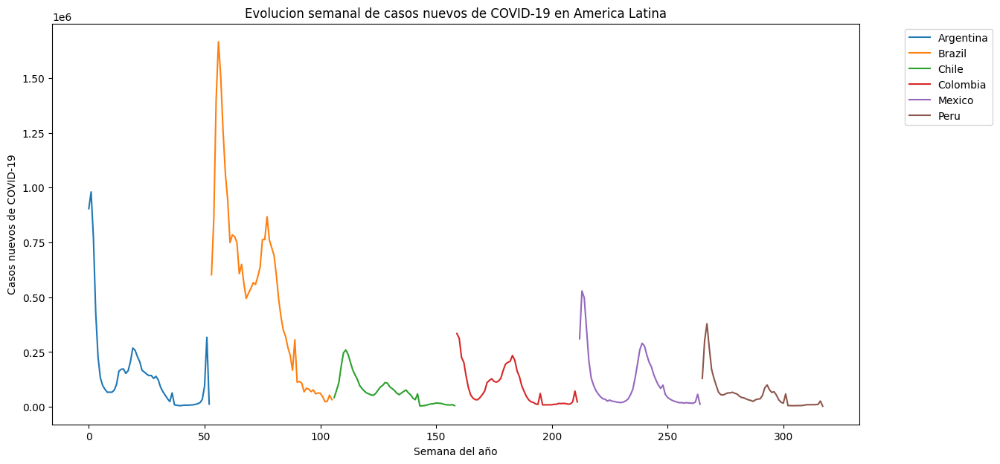

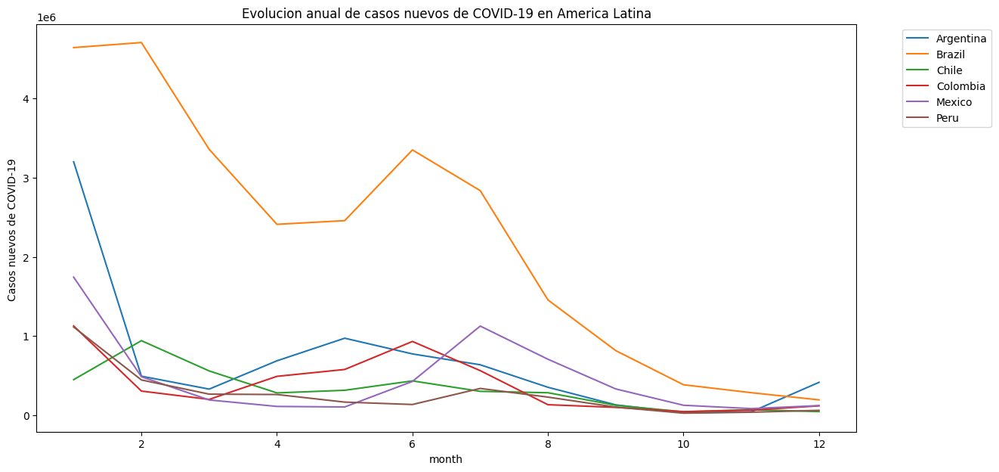

In [48]:
#Vamos a analizar como evolucionan los casos de COVID-19 en America Latina a lo largo del tiempo por semana
# usamos isocalendar 
data_latinoamerica_paises['week'] = data_latinoamerica_paises.index.isocalendar().week
data_latinoamerica_paises['year'] =data_latinoamerica_paises.index.isocalendar().year
weekly_cases = data_latinoamerica_paises.groupby(['country_name','week'])['new_confirmed'].sum().reset_index()
plt.figure(figsize=(14,7))
for country in weekly_cases['country_name'].unique():
    country_weekly_cases=weekly_cases[weekly_cases['country_name']==country]
    plt.plot(country_weekly_cases['new_confirmed'], label=country)

plt.xlabel('Semana del año')
plt.ylabel('Casos nuevos de COVID-19')
plt.title('Evolucion semanal de casos nuevos de COVID-19 en America Latina')
plt.legend(bbox_to_anchor=(1.05,1), loc='upper left')
plt.show()

#Por Año
data_latinoamerica_paises['month'] = data_latinoamerica_paises.index.month 
yearly_cases = data_latinoamerica_paises.groupby(['country_name','month'])['new_confirmed'].sum().reset_index()
plt.figure(figsize=(14,7))
for country in yearly_cases['country_name'].unique():
    country_yearly_cases = yearly_cases[yearly_cases['country_name']==country]
    plt.plot(country_yearly_cases['month'], country_yearly_cases['new_confirmed'],label=country)

plt.xlabel('month')
plt.ylabel('Casos nuevos de COVID-19 ')
plt.title('Evolucion anual de casos nuevos de COVID-19 en America Latina')
plt.legend(bbox_to_anchor=(1.05,1),loc='upper left')
plt.show()

De la grafica de arriba se puede observar que la cantidad de casos confirmados y muertes ha ido disminuyendo a lo largo del tiempo,sin embargo esto no quiere decir que la pandemia haya terminado, ya que la cantidad de casos confirmados y muertes sigue siendo alta ademas se nota un pico en las ultimas fechas.

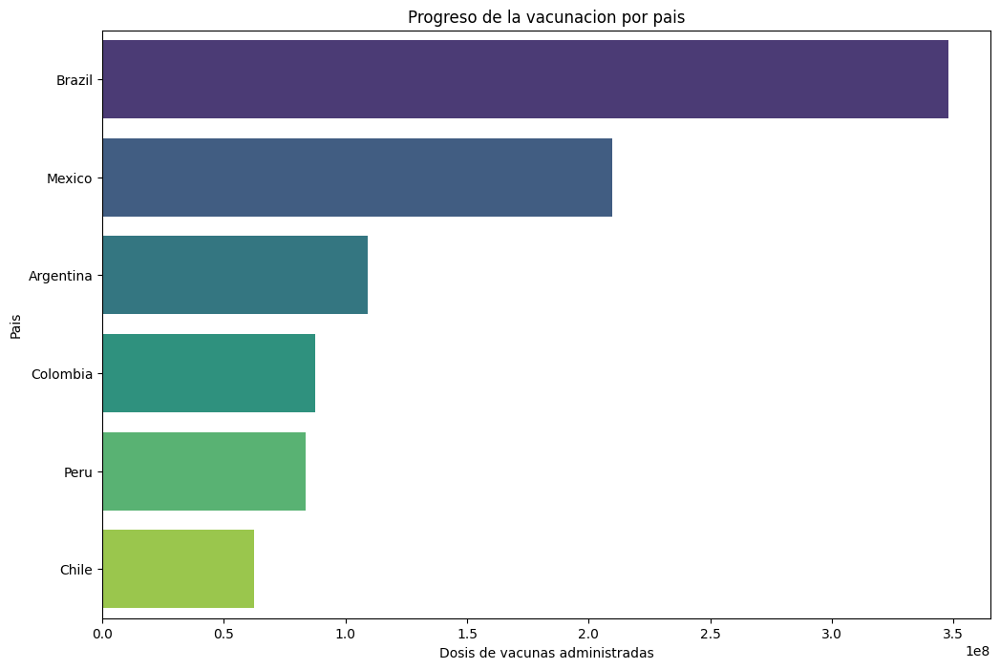

In [49]:
vaccination_data = data_latinoamerica_paises.groupby('country_name')['cumulative_vaccine_doses_administered'].max().sort_values(ascending=False)
plt.figure(figsize=(12,8))
sns.barplot(x=vaccination_data.values,y=vaccination_data.index,hue=vaccination_data.index, palette='viridis')
plt.xlabel('Dosis de vacunas administradas')
plt.ylabel('Pais')
plt.title('Progreso de la vacunacion por pais')

plt.show()

El pais con mayor dosis administradas es Brasil, seguido de Mexico,Argentina,Colombia,Chile y Peru. Se contradice con los hallazgos anteriores sin embargo recordemos que se debe tener en cuenta la poblacion de cada pais y la cantidad de vacunas disponibles.
comportamiento de la temperatura en los paises seleccionados:

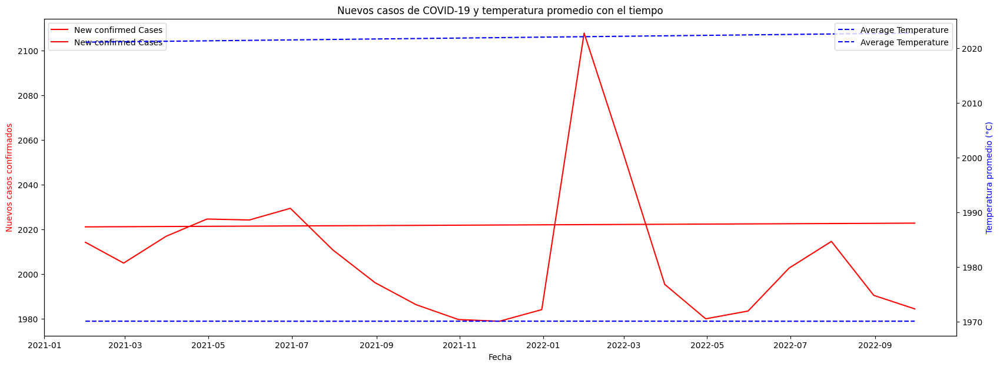

In [56]:
# Graficamos la relacion entre la temperatura promedio y los nuevos casos confirmados de COVID-19 

plt.figure(figsize=(20,7))
ax1 = plt.gca()
ax2 = ax1.twinx()

ax1.plot(data_latinoamerica_paises.resample('ME').mean(numeric_only=True).index,data_latinoamerica_paises.resample('ME').mean(numeric_only=True).index,data_latinoamerica_paises.resample('ME').mean(numeric_only=True)['new_confirmed'],color='red',label='New confirmed Cases')
ax2.plot(data_latinoamerica_paises.resample('ME').mean(numeric_only=True).index,data_latinoamerica_paises.resample('ME').mean(numeric_only=True).index,data_latinoamerica_paises.resample('ME').mean(numeric_only=True)['average_temperature_celsius'],color='blue',label='Average Temperature',linestyle='--')

ax1.set_xlabel('Fecha')
ax1.set_ylabel('Nuevos casos confirmados',color='red')
ax2.set_ylabel('Temperatura promedio (°C)',color='blue')
plt.title('Nuevos casos de COVID-19 y temperatura promedio con el tiempo')
ax1.legend(loc='upper left')
ax2.legend(loc='upper right')
plt.show()


Cada pais tiene un impacto debido a la urbanizacion y la densidad de poblacion ,por lo que vamos a analizar la densidad de poblacion en cada pais.

C:\Users\yana\AppData\Local\Temp\ipykernel_8584\446244492.py:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=urban_cases['urban_population_percentage'], y =urban_cases.index , palette='viridis')


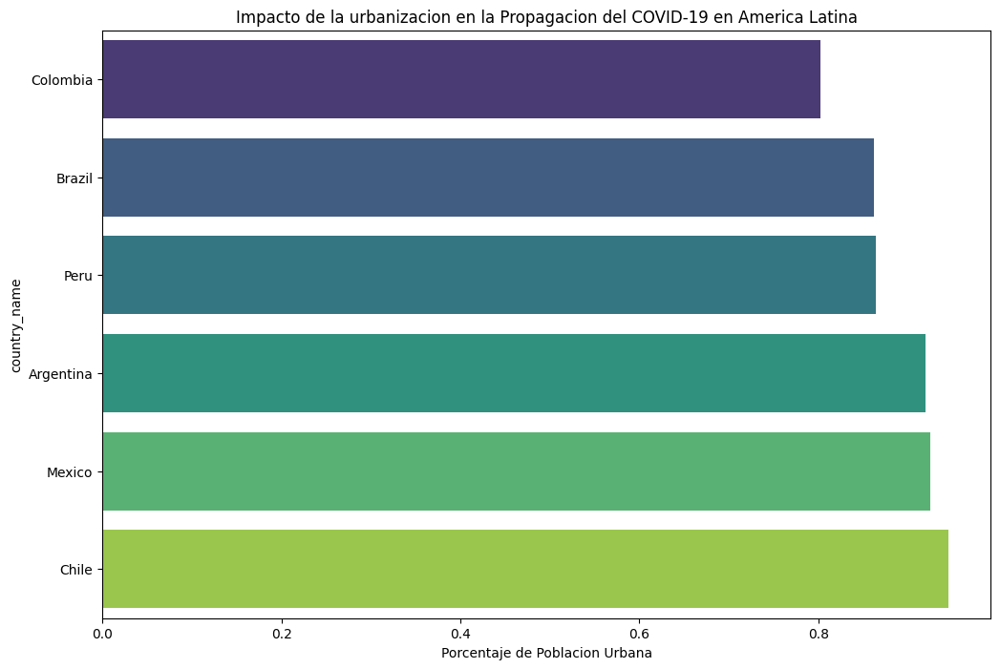

In [57]:
data_latinoamerica_paises['urban_population_percentage'] = data_latinoamerica_paises['population_urban'] / data_latinoamerica_paises['population']
urban_cases= data_latinoamerica_paises.groupby('country_name').last().sort_values(by='urban_population_percentage')

plt.figure(figsize=(12,8))
sns.barplot(x=urban_cases['urban_population_percentage'], y =urban_cases.index , palette='viridis')
plt.xlabel('Porcentaje de Poblacion Urbana')
plt.title('Impacto de la urbanizacion en la Propagacion del COVID-19 en America Latina')
plt.show()

El pais con mayor impacto en la propagacion fue Chile, aunque es extraño ya que Chile fue uno de los paises que mejor manejo la pandemia,sin embargo esto puede ser debido a la densidad de poblacion en Chile

Densidad de poblacion por grupos de edad:

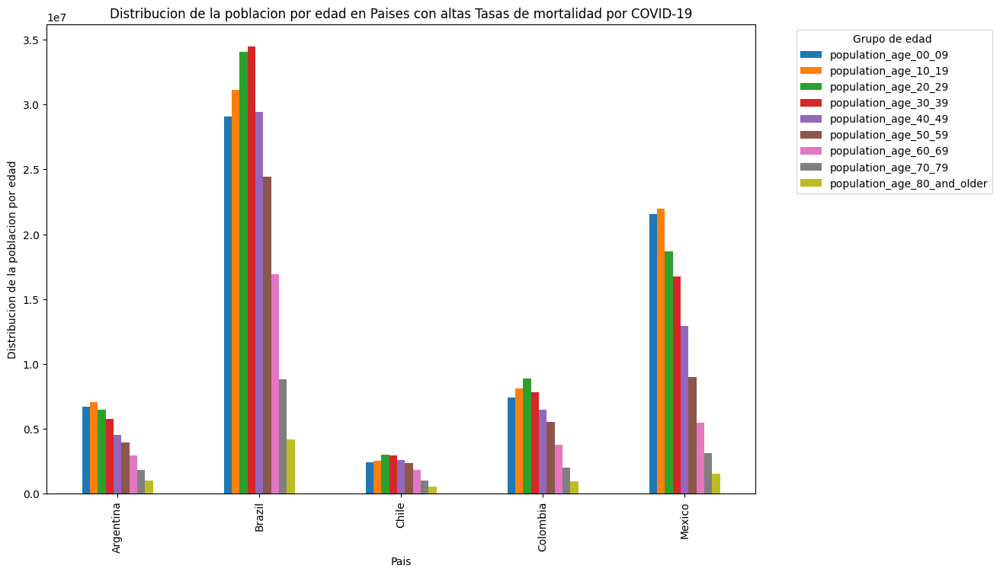

In [58]:
high_mortality_countries= data_latinoamerica_paises.groupby('country_name')['cumulative_deceased'].max().sort_values(ascending=False).head(5).index
age_groups= ['population_age_00_09','population_age_10_19','population_age_20_29','population_age_30_39','population_age_40_49','population_age_50_59','population_age_60_69','population_age_70_79','population_age_80_and_older']
age_distribution = data_latinoamerica_paises[data_latinoamerica_paises['country_name'].isin(high_mortality_countries)].groupby('country_name')[age_groups].mean()

age_distribution.plot(kind='bar',stacked=False, figsize=(12,8))
plt.xlabel('Pais')
plt.ylabel('Distribucion de la poblacion por edad')
plt.title('Distribucion de la poblacion por edad en Paises con altas Tasas de mortalidad por COVID-19')
plt.legend(bbox_to_anchor=(1.05,1),loc='upper left',title='Grupo de edad ')
plt.show()

El grafico muestra claramente la desigualdad en cantidades de poblacion por grupos de edad en los paises seleccionados aunque no proporcione muchas cosas interesantes. Es bueno tenerlo en cuenta para futuros analisis.

Sin embargo, podemos empezar a ver como fueron de buenas o malas las estrategias de vacunacion pra mitigar la mortalidad y los casos confirmados.

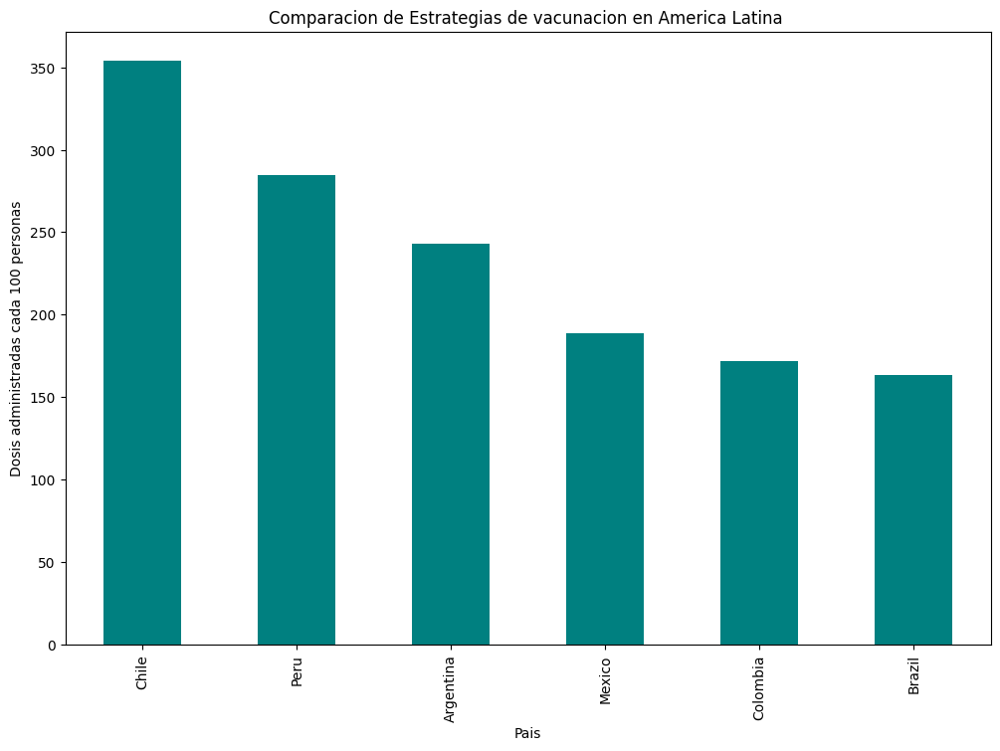

In [59]:
vaccination_strategy = data_latinoamerica_paises.groupby('country_name')['cumulative_vaccine_doses_administered'].max() / data_latinoamerica_paises.groupby('country_name')['population'].max()*100
vaccination_strategy.sort_values(ascending=False).plot(kind='bar', figsize=(12,8),color='teal')
plt.xlabel('Pais') #eje x
plt.ylabel('Dosis administradas cada 100 personas') #eje y
plt.title('Comparacion de Estrategias de vacunacion en America Latina ') #titulo
plt.show() # mostrar grafico

Nuevamente vemos el buen manejo de Chile (se dieron 350 dosis),como no asi de Colombia y Brazil.
con esto vamos viendo los paises que mas ayuda necesitan y donde se deberian crear los nuevos centros.
Anteriormente vimos los datos sobre la diabetes , ahora vamos a verlo en porcentajes

In [60]:
#uso de nlargest= valores mas grandes
data_latinoamerica_paises.groupby('country_name')['cumulative_deceased'].max().nlargest(5).index

Index(['Brazil', 'Argentina', 'Chile', 'Colombia', 'Mexico'], dtype='object', name='country_name')

In [61]:
#uso de nsmallest= valores mas pequeños
data_latinoamerica_paises.groupby('country_name')['cumulative_deceased'].max().nsmallest(5).index


Index(['Argentina', 'Chile', 'Colombia', 'Mexico', 'Peru'], dtype='object', name='country_name')

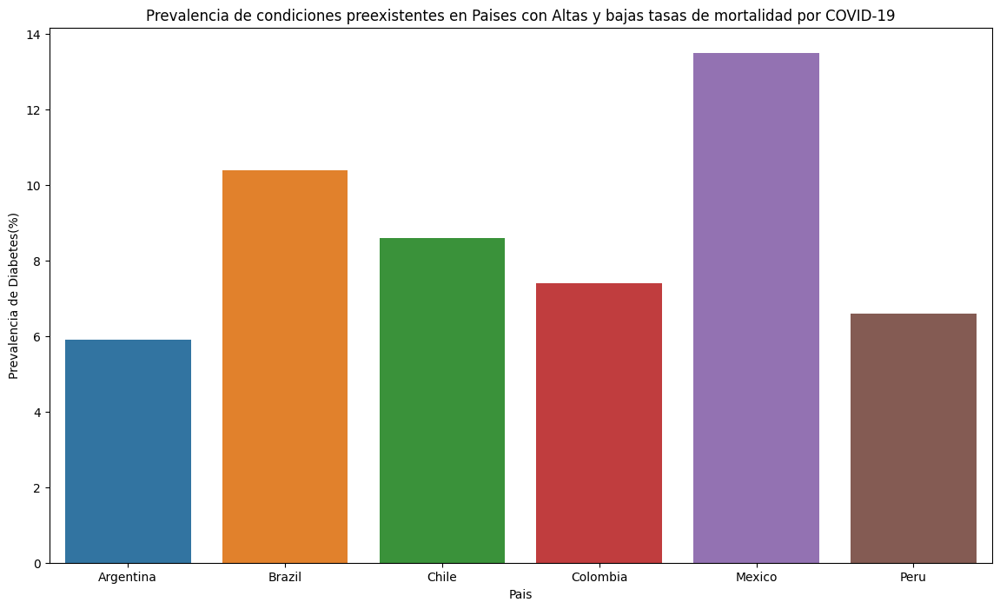

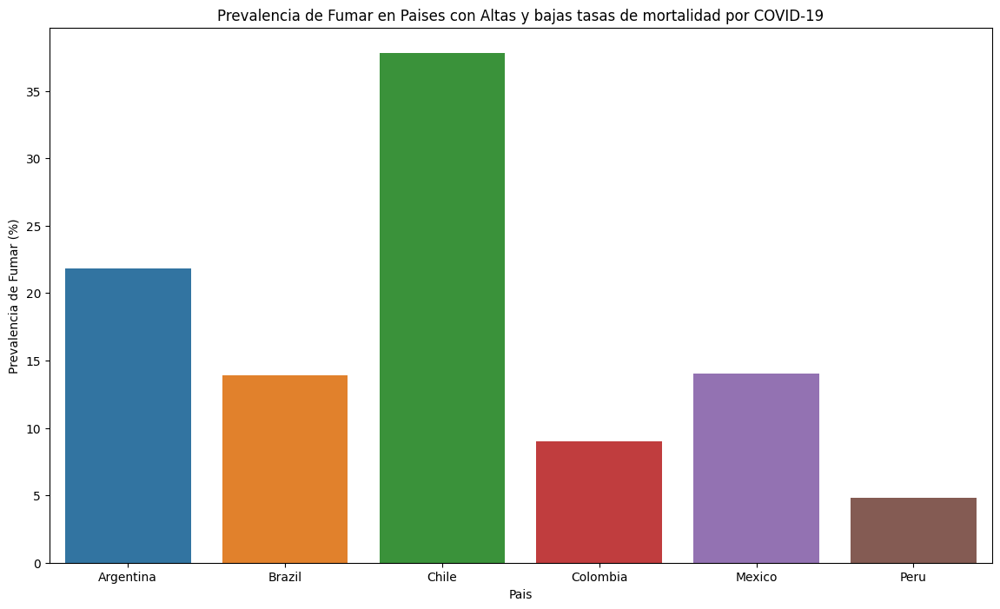

In [62]:
#Prevalencia de diabetes:
top_countries = data_latinoamerica_paises.groupby('country_name')['cumulative_deceased'].max().nlargest(5).index
bottom_countries= data_latinoamerica_paises.groupby('country_name')['cumulative_deceased'].max().nsmallest(5).index
conditions_data= data_latinoamerica_paises[data_latinoamerica_paises['country_name'].isin(top_countries.union(bottom_countries))]

plt.figure(figsize=(14,8))
sns.barplot(data=conditions_data, x ='country_name', y ='diabetes_prevalence',hue='country_name')
plt.xlabel('Pais')
plt.ylabel('Prevalencia de Diabetes(%)')
plt.title('Prevalencia de condiciones preexistentes en Paises con Altas y bajas tasas de mortalidad por COVID-19')
plt.show()

#Prevalencia de fumar:
plt.figure(figsize=(14,8))
sns.barplot(data=conditions_data, x ='country_name', y ='smoking_prevalence',hue='country_name')
plt.xlabel('Pais')
plt.ylabel('Prevalencia de Fumar (%)')
plt.title('Prevalencia de Fumar en Paises con Altas y bajas tasas de mortalidad por COVID-19')
# grafico
plt.show()

Podemos indentificar que la diabetes afecta mucho mas a Mexico y Brasil, por lo que se podria decir que estos paises son los que mas han sufrido por la diabetes.
Respecto a fumar se puede observar que afecta mas a Chile y Argentina, por lo que se podria decir que estos paises son los que mas han sufrido por el fumar.

Fatalidad por pais:

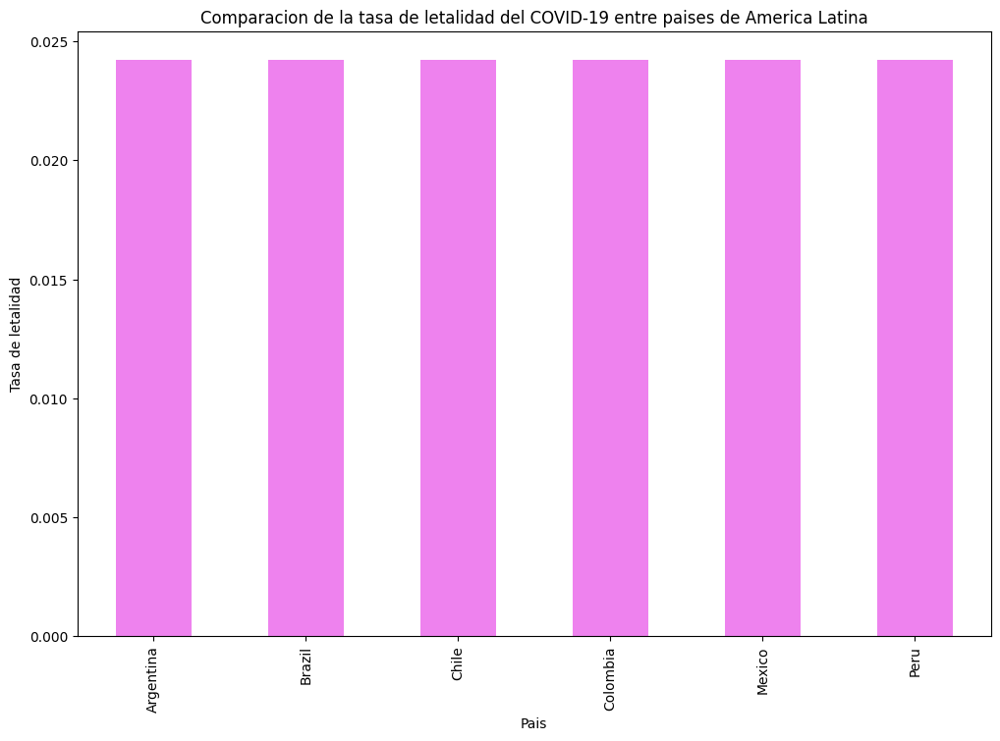

In [65]:
#calculamos la tasa de letalidad por pais
data_latinoamerica_paises['case_fatality_rate'] = data_latinoamerica_paises['cumulative_deceased']/data_latinoamerica_paises['cumulative_confirmed']
fatality_rates = data_latinoamerica_paises.groupby('country_name')['case_fatality_rate'].last().sort_values()

#creacion del grafico de barras
plt.figure(figsize=(12,8))
fatality_rates.plot(kind='bar',color='violet')

#configuracion de ejes y el titulo del grafico
plt.xlabel('Pais')
plt.ylabel('Tasa de letalidad')
plt.title('Comparacion de la tasa de letalidad del COVID-19 entre paises de America Latina')

#grafico
plt.show()

Todos los paises tuvieron un comportamiento similar en cuanto a la fatalidad, sin embargo, viendo las otras graficas observamos que han disminuido.
Los casos nuevos y las muertes nuevas han variado , esto debido a la vacunacion y a las medidas tomadas por estos paises , han disminuido la cantidad de personas que se han contagiado y fallecido.

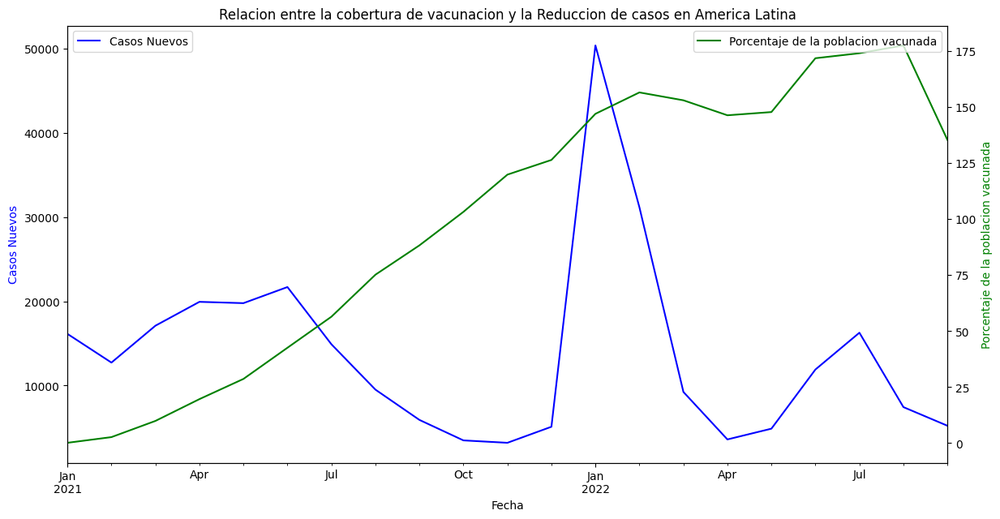

In [67]:
#Evolucion de vacunacion en America Latina y la reduccion de casos de COVID-19

plt.figure(figsize=(14,7))
ax1=plt.gca()
ax2=ax1.twinx()

#Creacion de porcentajes de vacunacion
data_latinoamerica_paises['percentage_vaccinated'] = (data_latinoamerica_paises['cumulative_vaccine_doses_administered'] / data_latinoamerica_paises['population'])*100
data_latinoamerica_paises.resample('ME').mean(numeric_only=True)['new_confirmed'].plot(ax=ax1, color='blue', label='Casos Nuevos')
data_latinoamerica_paises.resample('ME').mean(numeric_only=True)['percentage_vaccinated'].plot(ax=ax2, color='green',label = 'Porcentaje de la poblacion vacunada')

ax1.set_xlabel('Fecha')
ax1.set_ylabel('Casos Nuevos',color='blue')
ax2.set_ylabel('Porcentaje de la poblacion vacunada' , color='green')
ax1.set_title('Relacion entre la cobertura de vacunacion y la Reduccion de casos en America Latina')
ax1.legend(loc='upper left')
ax2.legend(loc='upper right')
plt.show()

C:\Users\yana\AppData\Local\Temp\ipykernel_8584\3395861785.py:5: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.lineplot(data=data_latinoamerica_paises, x ='date', y='mortality_rate',estimator='mean',ci=None)


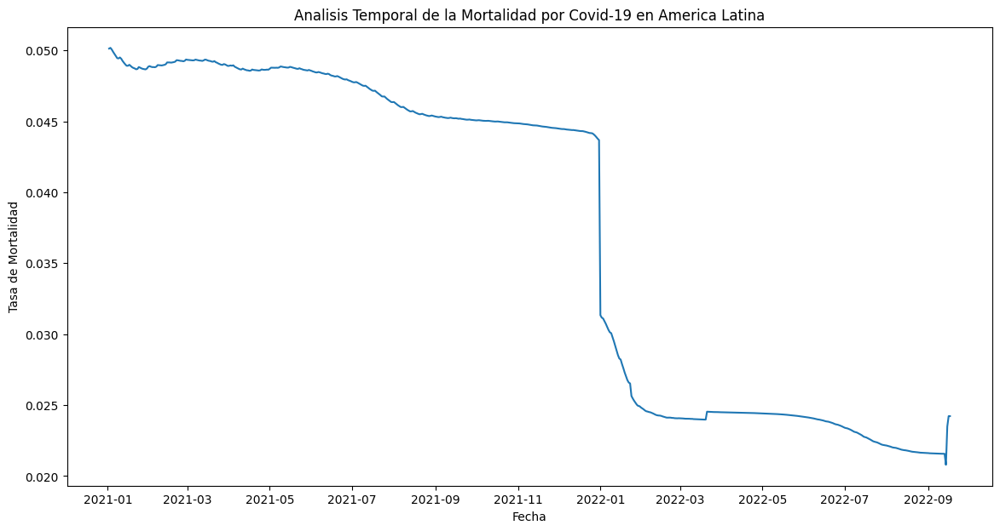

In [68]:
#Como evoluciono la mortalidad:
data_latinoamerica_paises['mortality_rate'] = data_latinoamerica_paises['cumulative_deceased'] /data_latinoamerica_paises['cumulative_confirmed']

plt.figure(figsize=(14,7))
sns.lineplot(data=data_latinoamerica_paises, x ='date', y='mortality_rate',estimator='mean',ci=None)
plt.title('Analisis Temporal de la Mortalidad por Covid-19 en America Latina')
plt.xlabel('Fecha')
plt.ylabel('Tasa de Mortalidad')
plt.show()

Los casos activos han disminuido y los casos recuperados han aumentado, esto debido a la vacunacion y a las medidas tomadas por los paises.

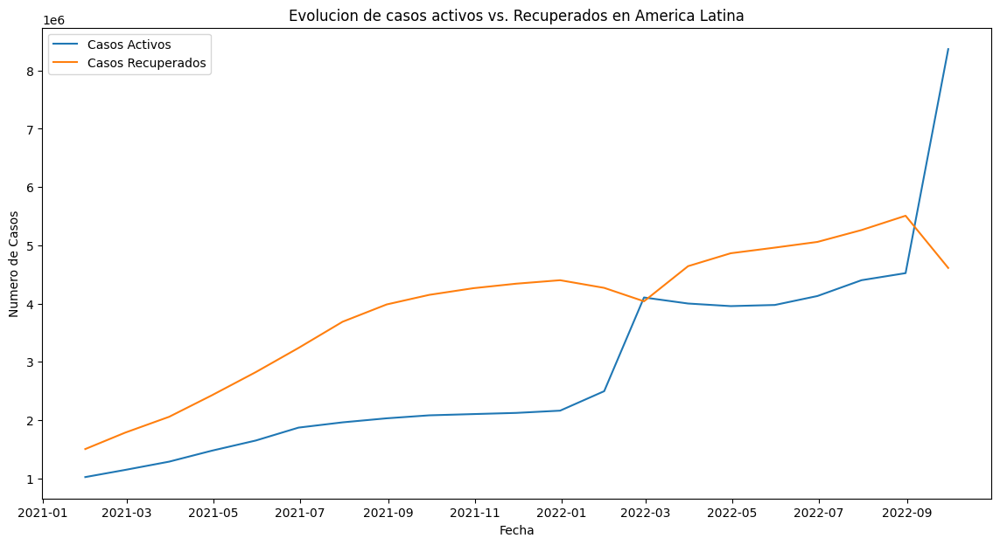

In [69]:
# Evolucion de los casos activos y recuperados en America Latina

data_latinoamerica_paises['active_cases'] = data_latinoamerica_paises['cumulative_confirmed'] - data_latinoamerica_paises['cumulative_deceased'] - data_latinoamerica_paises['cumulative_recovered']
plt.figure(figsize=(14,7))
sns.lineplot(data=data_latinoamerica_paises.resample('ME').mean(numeric_only=True),x='date', y='active_cases',label ='Casos Activos')
sns.lineplot(data=data_latinoamerica_paises.resample('ME').mean(numeric_only=True),x='date', y='cumulative_recovered',label ='Casos Recuperados')
plt.xlabel('Fecha')
plt.ylabel('Numero de Casos')
plt.title('Evolucion de casos activos vs. Recuperados en America Latina')
plt.legend()
plt.show()

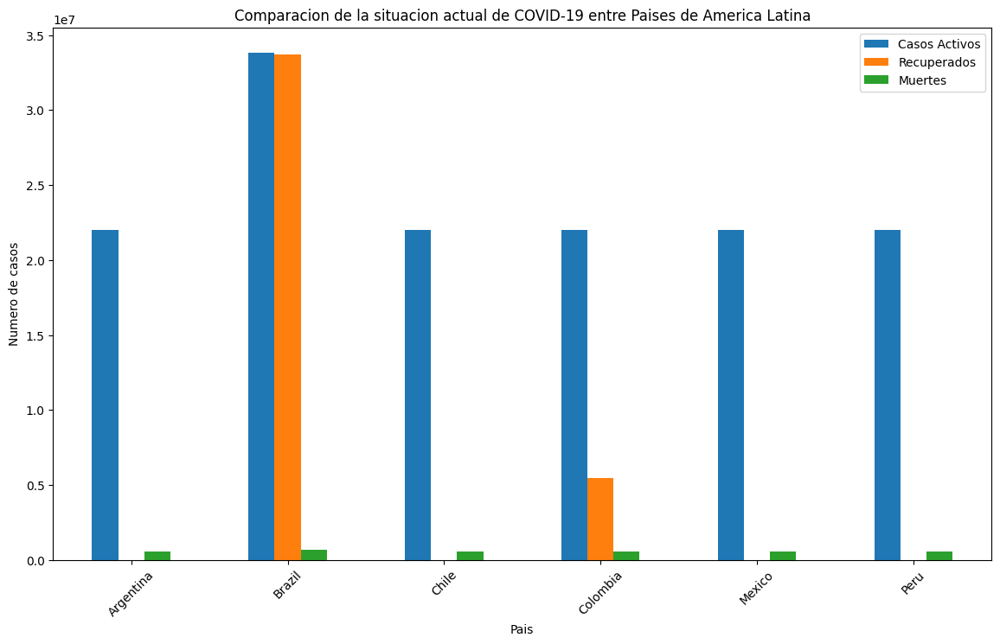

In [74]:
# Comparacion de la situacion actual del COVID-19 entre los paises de America Latina

current_situation= data_latinoamerica_paises.groupby('country_name').max()[['active_cases','cumulative_recovered','cumulative_deceased']]
current_situation.plot(kind='bar', stacked=False, figsize=(14,8))
plt.title('Comparacion de la situacion actual de COVID-19 entre Paises de America Latina')
plt.xlabel('Pais')
plt.ylabel('Numero de casos')
plt.legend(['Casos Activos','Recuperados','Muertes'])
plt.xticks(rotation=45) #rotacion de 45 grados
plt.show()

Para concluir, los paises donde debe expandirse la empresa farmaceutica son,Brazil,Mexico y Colombia, ya que son los paises que mas casos confirmados y muertes han tenido, ademas de ser los paises que menos vacunas han administrado, quizas no se han manejado de la mejor manera en cuanto a la vacunacion o no han tenido la cantidad necesarias de vacunas.